<a href="https://colab.research.google.com/github/amsc101/ICU/blob/master/ICU_Mortality_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## ICU Mortality Prediction

In [0]:
# Import libraries
import numpy as np
import matplotlib
import scipy.stats as ss
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from plotly.offline import init_notebook_mode,iplot
import plotly.graph_objects as go
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import RFE
from sklearn.ensemble import ExtraTreesClassifier

#### 1. Data visualitation 

In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [0]:
data = pd.read_csv("/content/drive/My Drive/training_v2.csv")
data.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,...,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,2.3,113.0,502.01,0,0.0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,NaN,108.0,203.01,0,0.0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0.0,46.0,37.0,37.0,51.0,7.45,...,1.3,1.3,3.5,3.5,557.0,557.0,4.2,4.2,145.0,145.0,12.7,12.7,37.0,37.0,7.45,7.45,51.0,51.0,54.8,51.000000,37.0,37.0,7.45,7.45,51.0,51.0,51.0,51.0,0.47,0.29,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.95,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,0,95.3,NaN,122.0,703.03,0,0.0,NaN,NaN,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0.0,68.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.64,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,0,61.7,NaN,203.0,1206.03,1,0.0,NaN,NaN,NaN,0.6,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1.0,60.0,30.0,30.0,142.0,7.39,...,1.6,1.1,NaN,NaN,43.0,43.0,NaN,NaN,NaN,NaN,8.8,8.8,37.0,27.0,7.44,7.34,337.0,102.0,342.5,236.666667,36.0,33.0,7.37,7.34,337.0,265.0,337.0,337.0,0.04,0.03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,0,NaN,NaN,119.0,601.01,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.0,NaN,0.0,103.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma


In [0]:
print('nº of variables : ', data.shape[1],'\nnº of patients: ', data.shape[0])

nº of variables :  186 
nº of patients:  91713


In [0]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Columns: 186 entries, encounter_id to apache_2_bodysystem
dtypes: float64(170), int64(8), object(8)
memory usage: 130.1+ MB


In [0]:
df = data[data.columns[0:20]]
df.isna().sum()

encounter_id                 0
patient_id                   0
hospital_id                  0
hospital_death               0
age                       4228
bmi                       3429
elective_surgery             0
ethnicity                 1395
gender                      25
height                    1334
hospital_admit_source    21409
icu_admit_source           112
icu_id                       0
icu_stay_type                0
icu_type                     0
pre_icu_los_days             0
readmission_status           0
weight                    2720
albumin_apache           54379
apache_2_diagnosis        1662
dtype: int64

In [0]:
#pre_data.columns[:36]

**AGE**: edad

(16.0, 89.0)

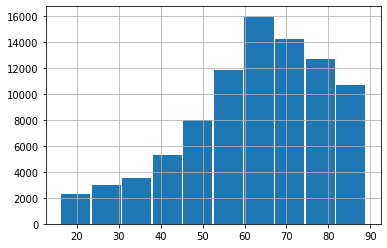

In [0]:
data['age'].hist(rwidth=0.95)
min(data['age']),max(data['age'])

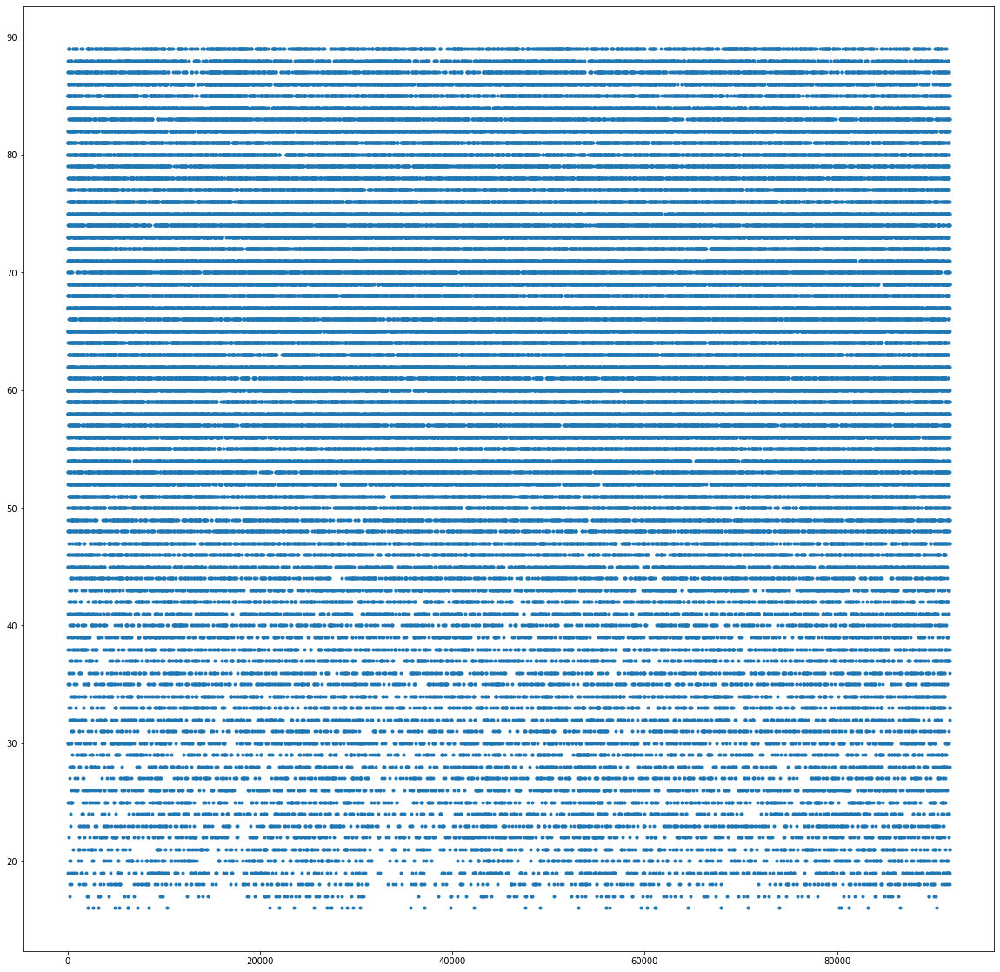

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['age'],'.')
plt.show()

**BMI**: relacion peso altura, valores normales (18.5,40)

(14.84492591, 67.81498973)

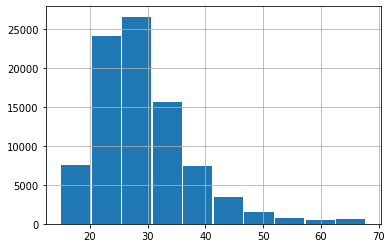

In [0]:
data['bmi'].hist(rwidth=0.95)
min(data['bmi']),max(data['bmi'])

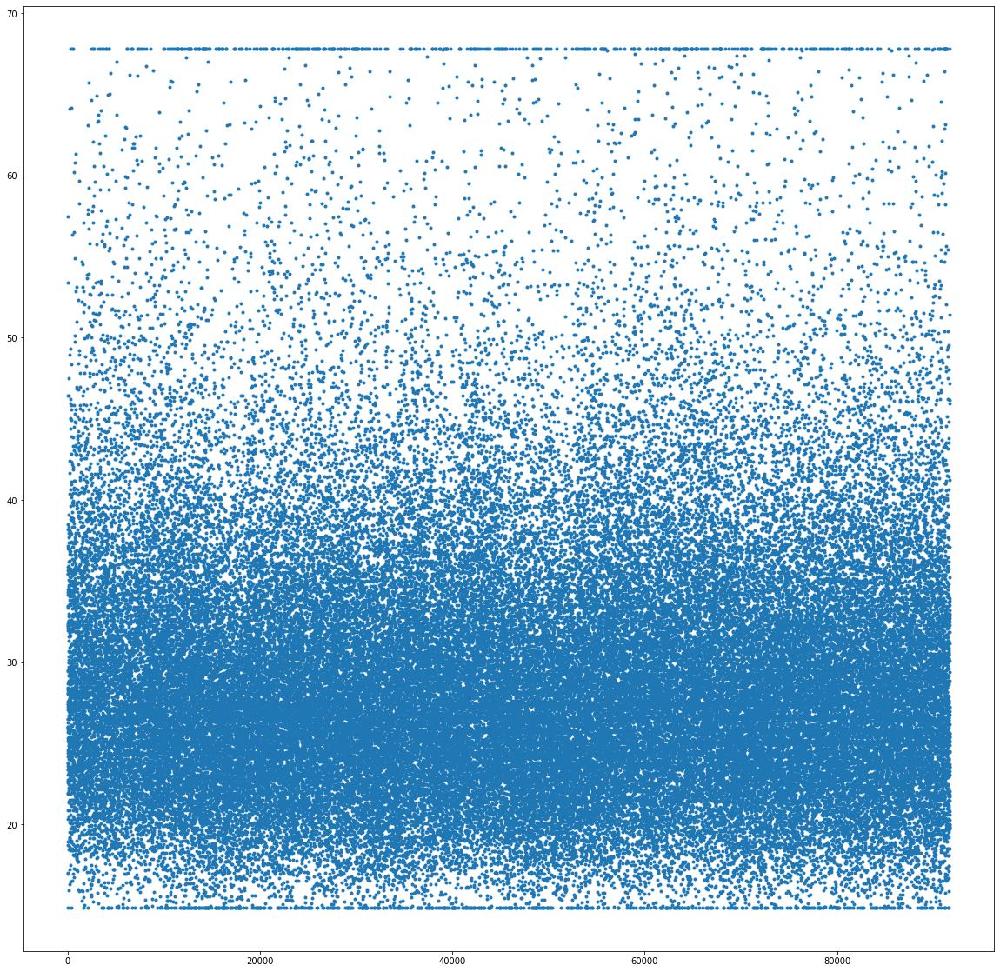

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['bmi'],'.')
plt.show()

**HEIGHT**:altura

(137.2, 195.59)

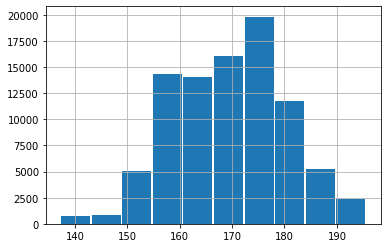

In [0]:
data['height'].hist(rwidth=0.95)
min(data['height']),max(data['height'])

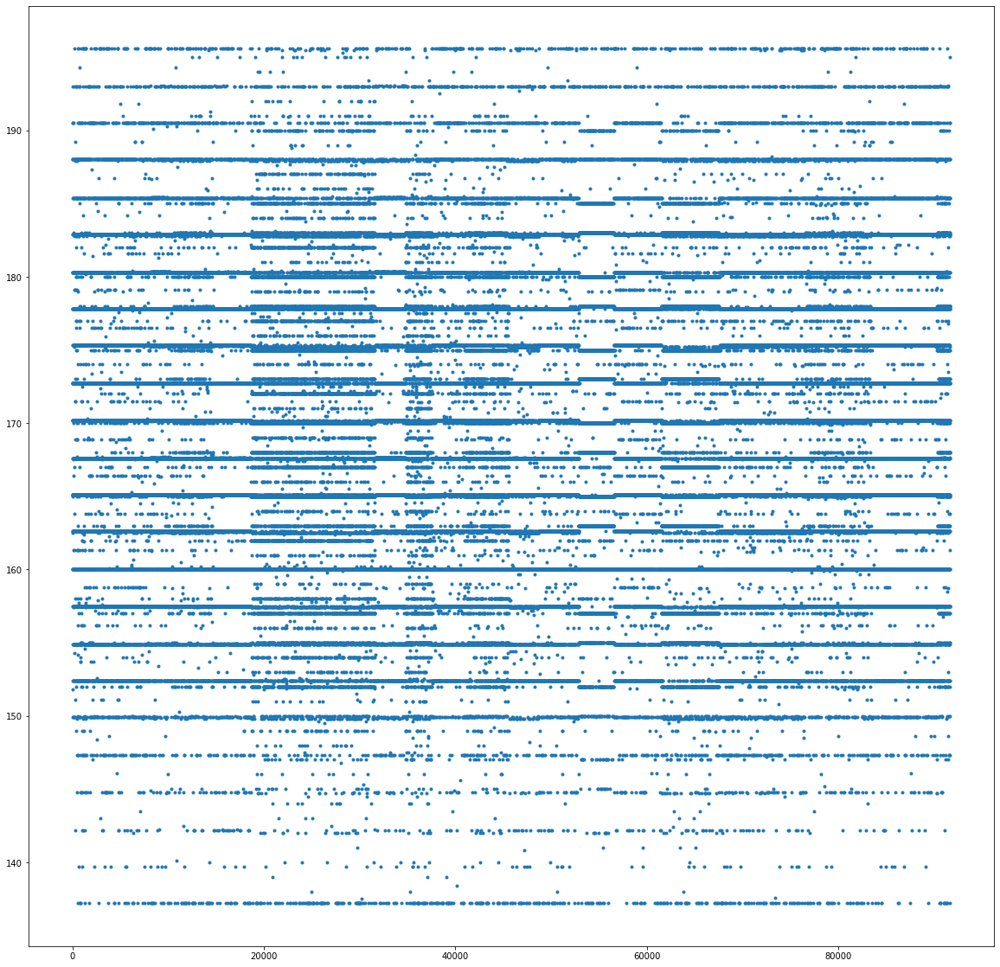

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['height'],'.')
plt.show()

**PRE ICU LOS DAYS**: The length of stay of the patient between hospital admission and unit admission

OUTLIERS!!

(-24.94722222, 159.09097219999998)

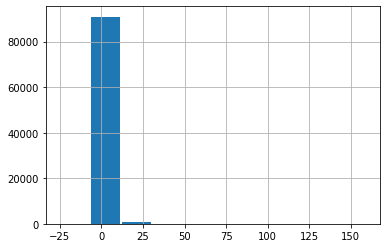

In [0]:
data['pre_icu_los_days'].hist(rwidth=0.95)
min(data['pre_icu_los_days']),max(data['pre_icu_los_days'])

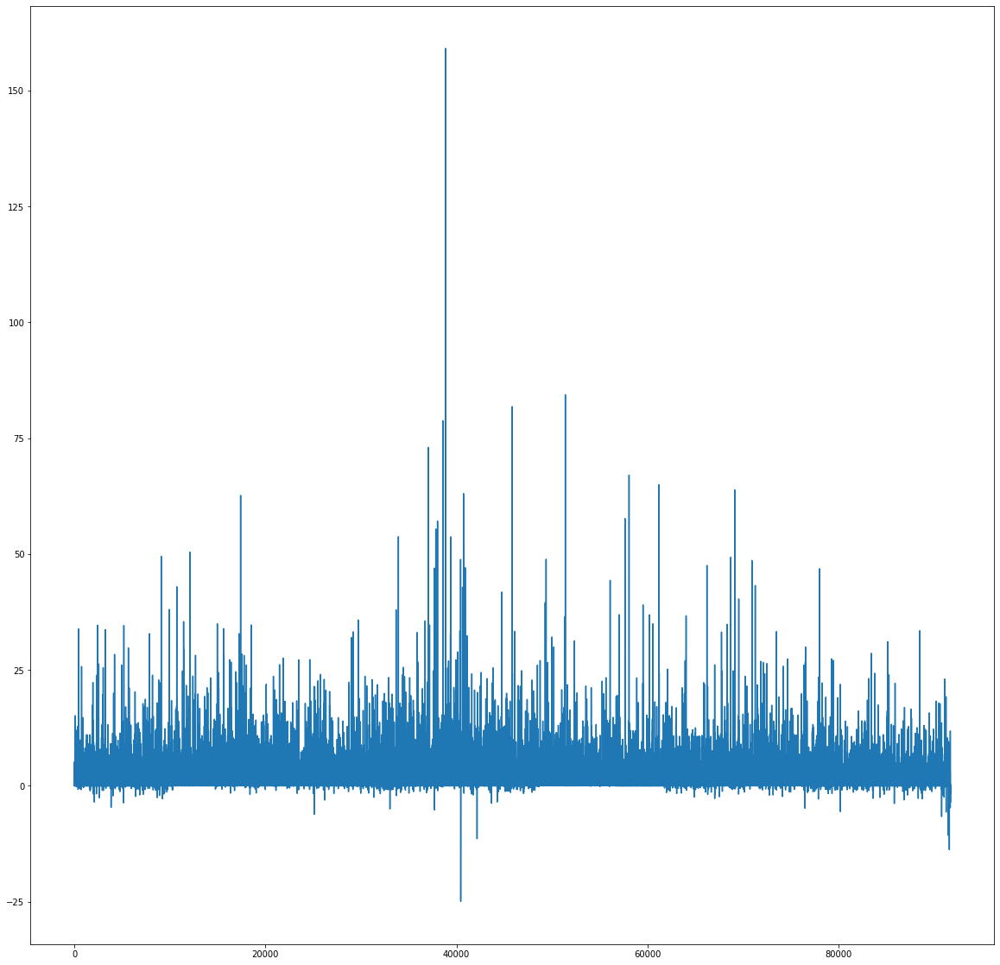

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['pre_icu_los_days'])
plt.show()

**APACHE 2 DIAGNOSIS**: sistema de clasificación de severidad o gravedad de enfermedades

Categorica

In [0]:
type(data['apache_2_diagnosis'][0])
min(data['apache_2_diagnosis']),max(data['apache_2_diagnosis'])

(101.0, 308.0)

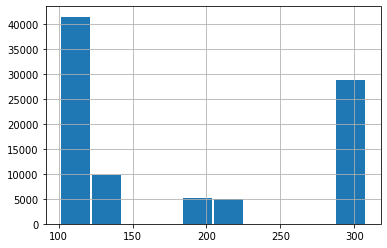

In [0]:
data['apache_2_diagnosis'].hist(rwidth=0.95)

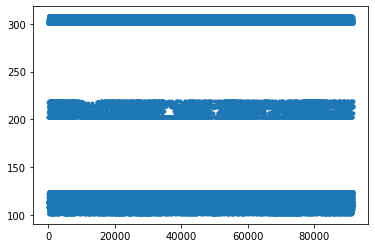

In [0]:
plt.plot(data['apache_2_diagnosis'],'.')
plt.show()

**APACHE 3J DIAGNOSIS**: The APACHE III-J sub-diagnosis code which best describes the reason for the ICU admission

In [0]:
print(type(data['apache_3j_diagnosis'][0]))

<class 'numpy.float64'>


(0.01, 2201.05)

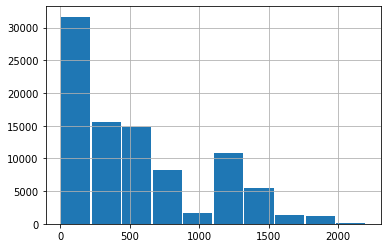

In [0]:
data['apache_3j_diagnosis'].hist(rwidth=0.95)
min(data['apache_3j_diagnosis']),max(data['apache_3j_diagnosis'])

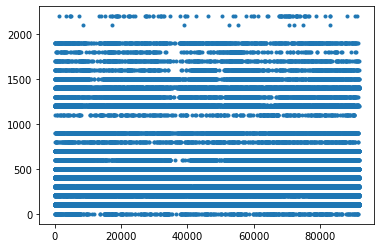

In [0]:
plt.plot(data['apache_3j_diagnosis'],'.')
plt.show()

**ARF APACHE**:Whether the patient had acute renal failure during the first 24 hours of their unit stay, defined as a 24 hour urine output <410ml, creatinine >=133 micromol/L and no chronic dialysis

In [0]:
type(data['arf_apache'][0])

numpy.float64

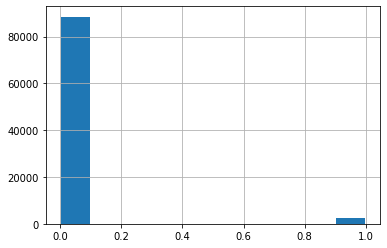

In [0]:
data['arf_apache'].hist(rwidth=0.95)

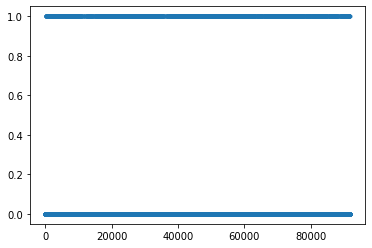

In [0]:
plt.plot(data['arf_apache'],'.')
plt.show()

**BUN APACHE**: The blood urea nitrogen concentration measured during the first 24 hours which results in the highest APACHE III score

(4.0, 127.0)

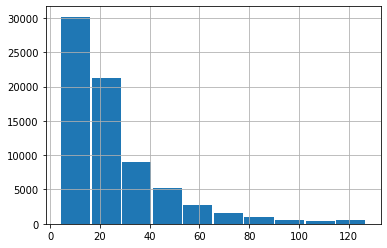

In [0]:
data['bun_apache'].hist(rwidth=0.95)
min(data['bun_apache']),max(data['bun_apache'])

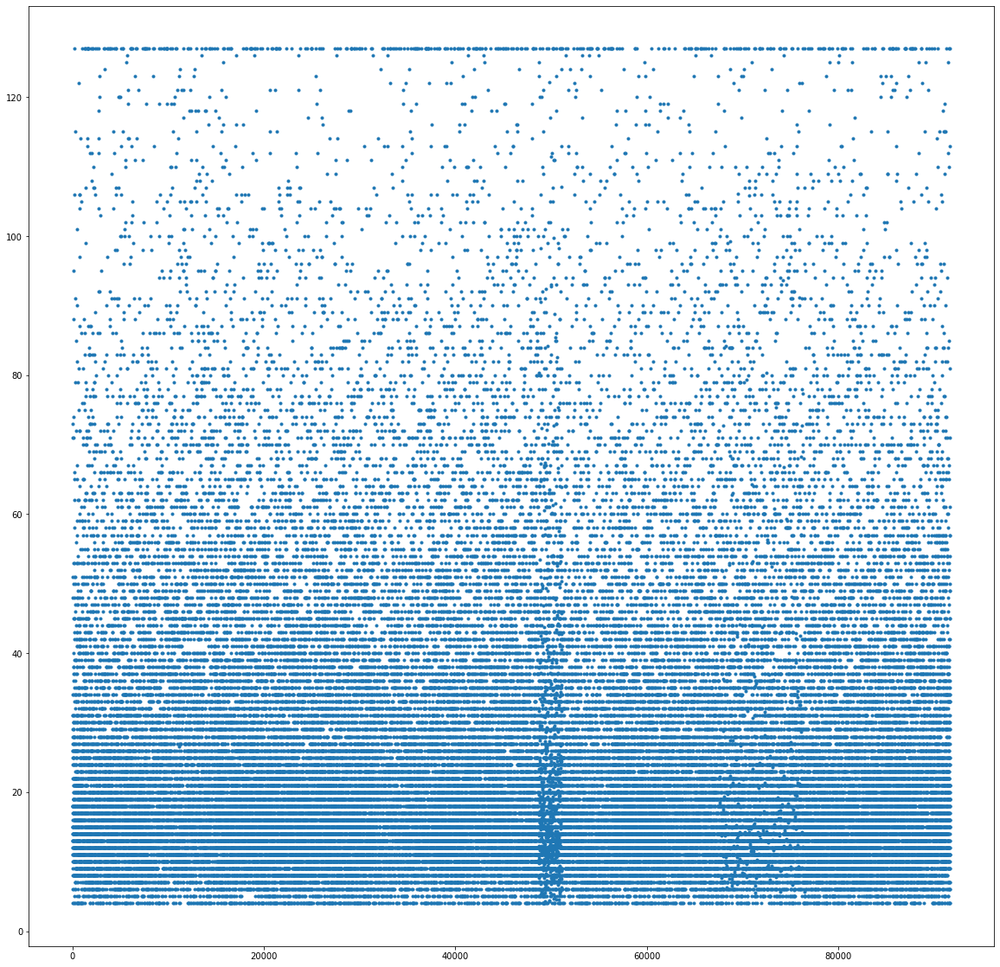

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['bun_apache'],'.')
plt.show()

**CREATINE APACHE**: The creatinine concentration measured during the first 24 hours which results in the highest APACHE III score

(0.3, 11.18)

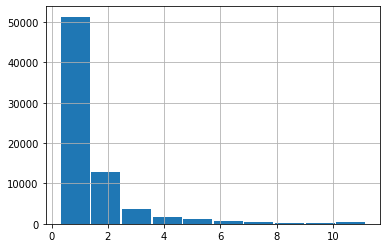

In [0]:
data['creatinine_apache'].hist(rwidth=0.95)
min(data['creatinine_apache']),max(data['creatinine_apache'])

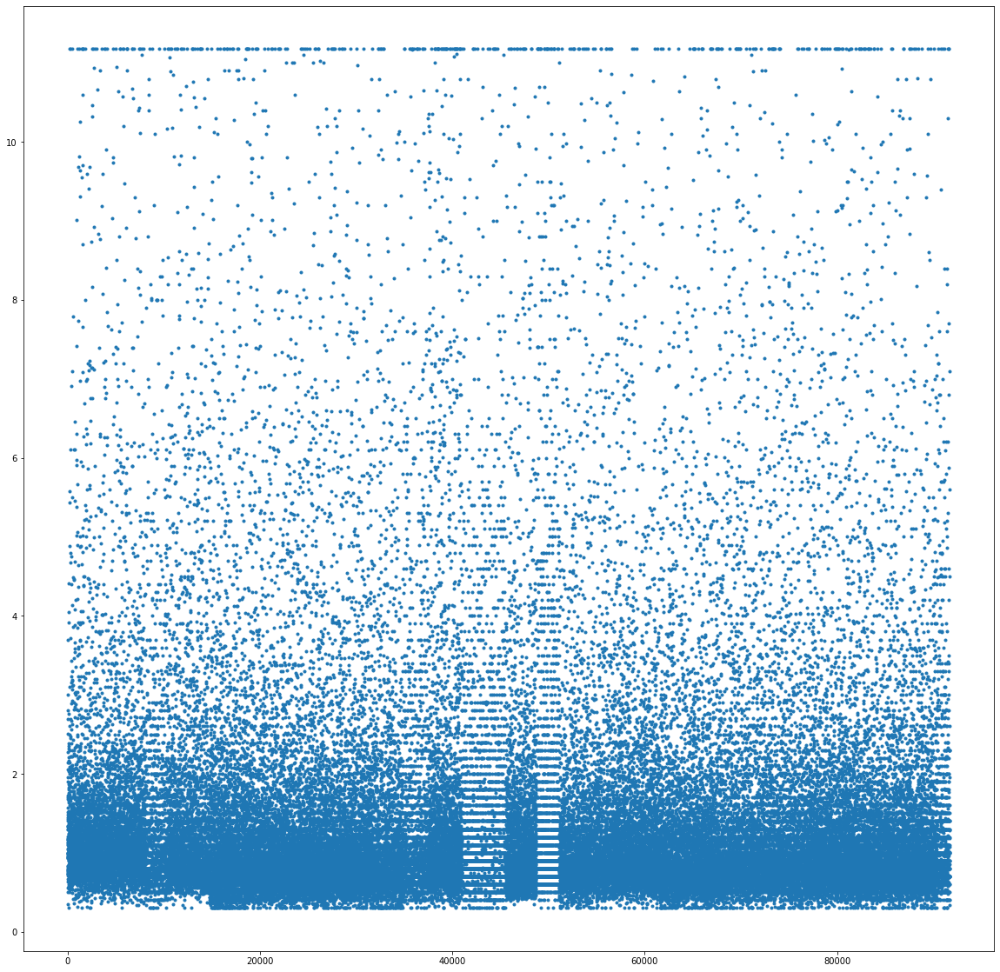

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['creatinine_apache'],'.')
plt.show()

**GCS EYES APACHE**: The eye opening component of the Glasgow Coma Scale measured during the first 24 hours which results in the highest APACHE III score

In [0]:
type(data['gcs_eyes_apache'][0])

numpy.float64

(1.0, 4.0)

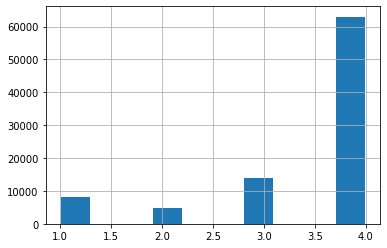

In [0]:
data['gcs_eyes_apache'].hist(rwidth=0.95)
min(data['gcs_eyes_apache']),max(data['gcs_eyes_apache'])

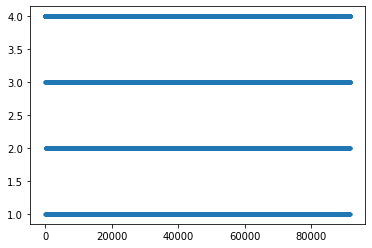

In [0]:
plt.plot(data['gcs_eyes_apache'],'.')
plt.show()

**GCS MOTOR APACHE**:The motor component of the Glasgow Coma Scale measured during the first 24 hours which results in the highest APACHE III score

In [0]:
type(data['gcs_motor_apache'][0])

numpy.float64

(1.0, 6.0)

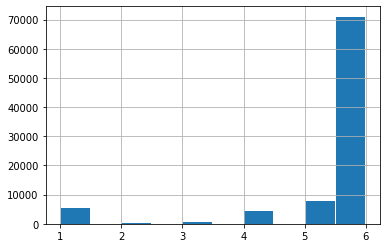

In [0]:
data['gcs_motor_apache'].hist(rwidth=0.95)
min(data['gcs_motor_apache']),max(data['gcs_motor_apache'])

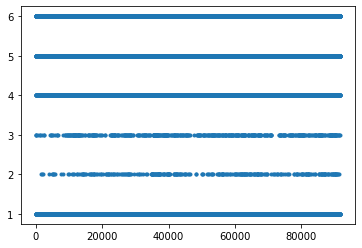

In [0]:
plt.plot(data['gcs_motor_apache'],'.')
plt.show()

**GCS UNABLE APACHE**: Whether the Glasgow Coma Scale was unable to be assessed due to patient sedation

In [0]:
type(data['gcs_unable_apache'][0])

numpy.float64

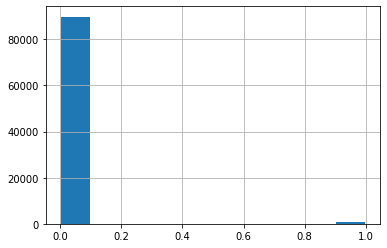

In [0]:
data['gcs_unable_apache'].hist(rwidth=0.95)

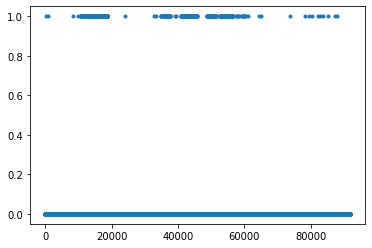

In [0]:
plt.plot(data['gcs_unable_apache'],'.')
plt.show()

**GCS VERBAL APACHE**:The verbal component of the Glasgow Coma Scale measured during the first 24 hours which results in the highest APACHE III score

In [0]:
type(data['gcs_verbal_apache'][0])
min(data['gcs_verbal_apache']),max(data['gcs_verbal_apache'])

(1.0, 5.0)

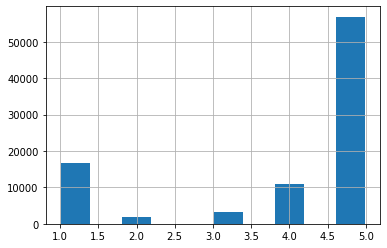

In [0]:
data['gcs_verbal_apache'].hist(rwidth=0.95)

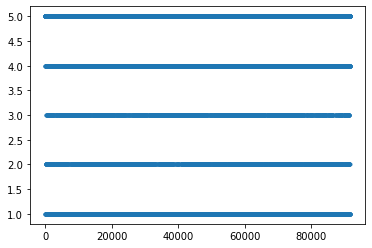

In [0]:
plt.plot(data['gcs_verbal_apache'],'.')
plt.show()

**GLUCOSE APACHE**:The glucose concentration measured during the first 24 hours which results in the highest APACHE III score

(39.0, 598.7)

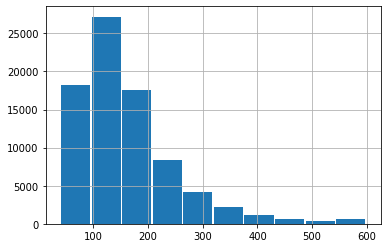

In [0]:
data['glucose_apache'].hist(rwidth=0.95)
min(data['glucose_apache']),max(data['glucose_apache'])

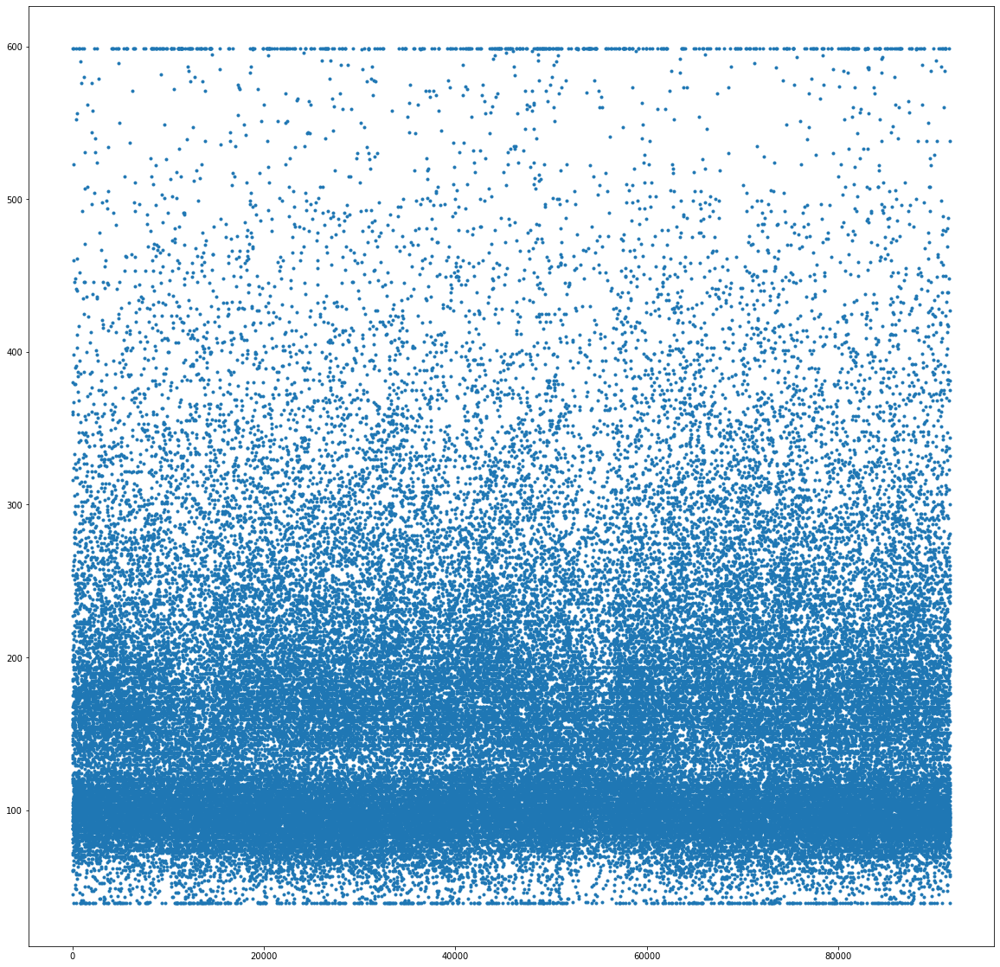

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['glucose_apache'],'.')
plt.show()

**HEART RATE APACHE**:The heart rate measured during the first 24 hours which results in the highest APACHE III score

(30.0, 178.0)

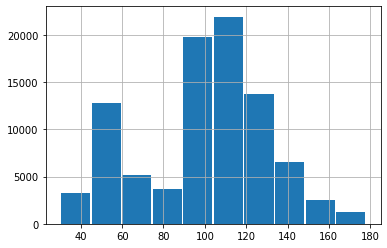

In [0]:
data['heart_rate_apache'].hist(rwidth=0.95)
min(data['heart_rate_apache']),max(data['heart_rate_apache'])

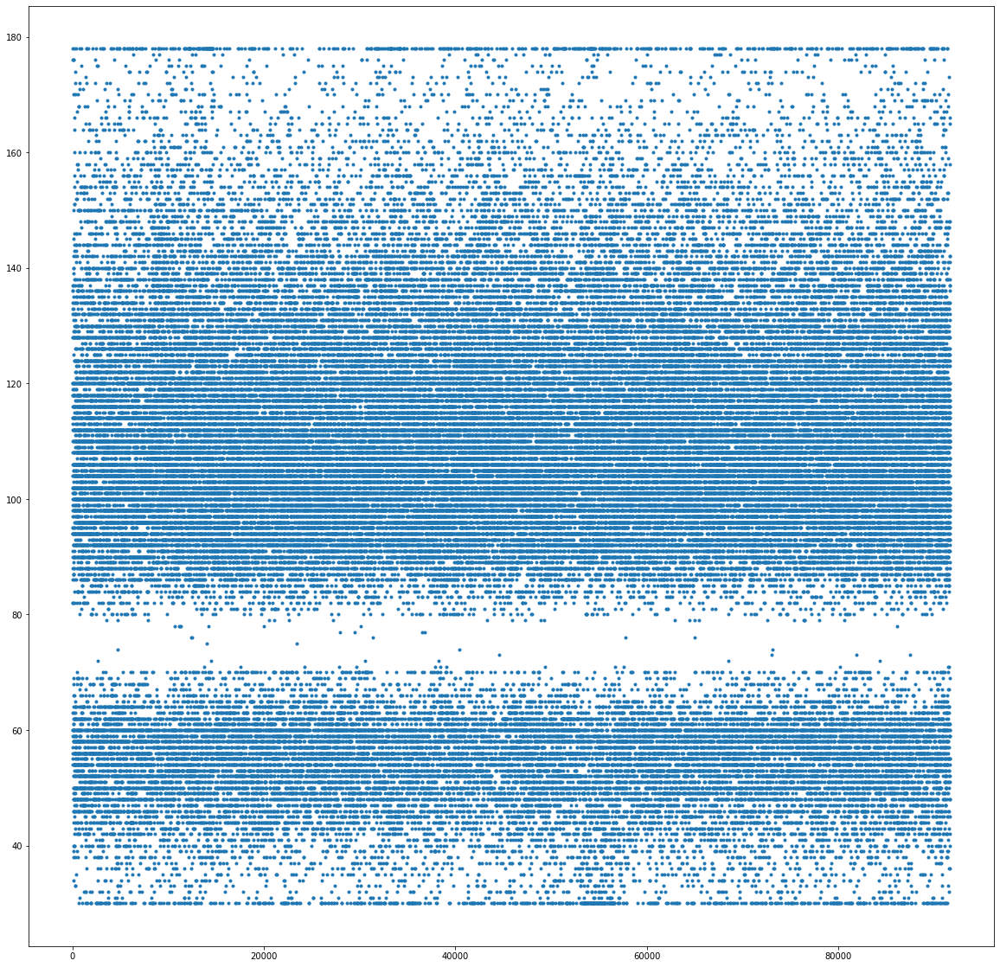

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['heart_rate_apache'],'.')
plt.show()

**HEMATOCRIT APACHE**: The hematocrit measured during the first 24 hours which results in the highest APACHE III score

(16.2, 51.4)

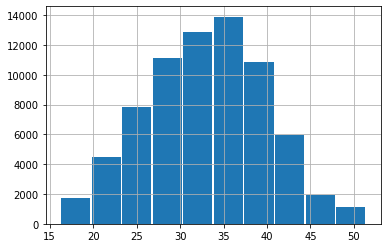

In [0]:
data['hematocrit_apache'].hist(rwidth=0.95)
min(data['hematocrit_apache']),max(data['hematocrit_apache'])

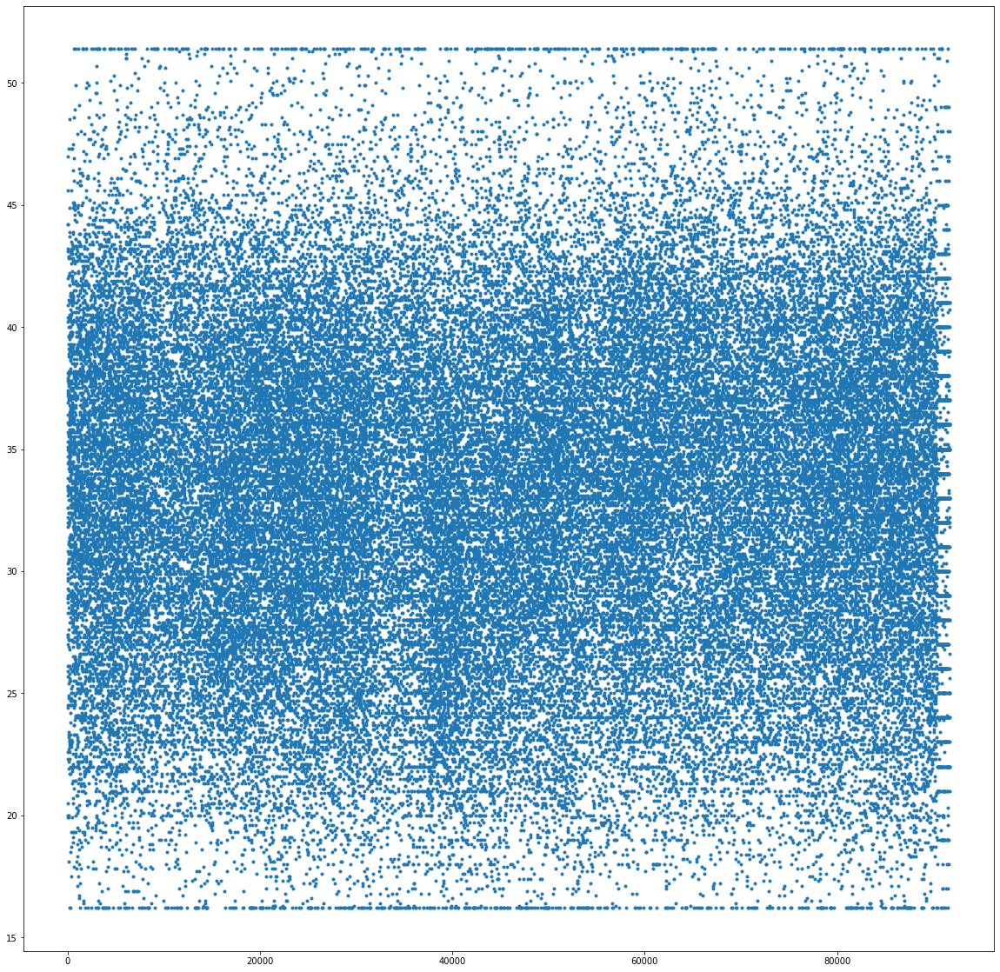

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['hematocrit_apache'],'.')
plt.show()

**INTUBATED APACHE**:Whether the patient was intubated at the time of the highest scoring arterial blood gas used in the oxygenation score

In [0]:
type(data['intubated_apache'][0])

numpy.float64

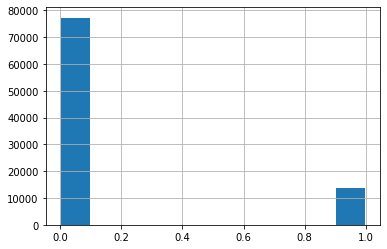

In [0]:
data['intubated_apache'].hist(rwidth=0.95)

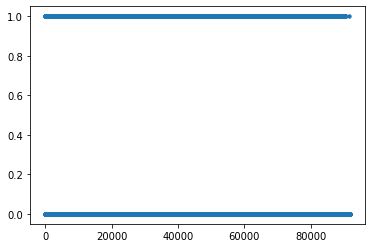

In [0]:
plt.plot(data['intubated_apache'],'.')
plt.show()

**MAP APACHE**:The mean arterial pressure measured during the first 24 hours which results in the highest APACHE III score

(40.0, 200.0)

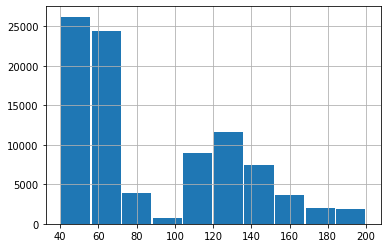

In [0]:
data['map_apache'].hist(rwidth=0.95)
min(data['map_apache']),max(data['map_apache'])

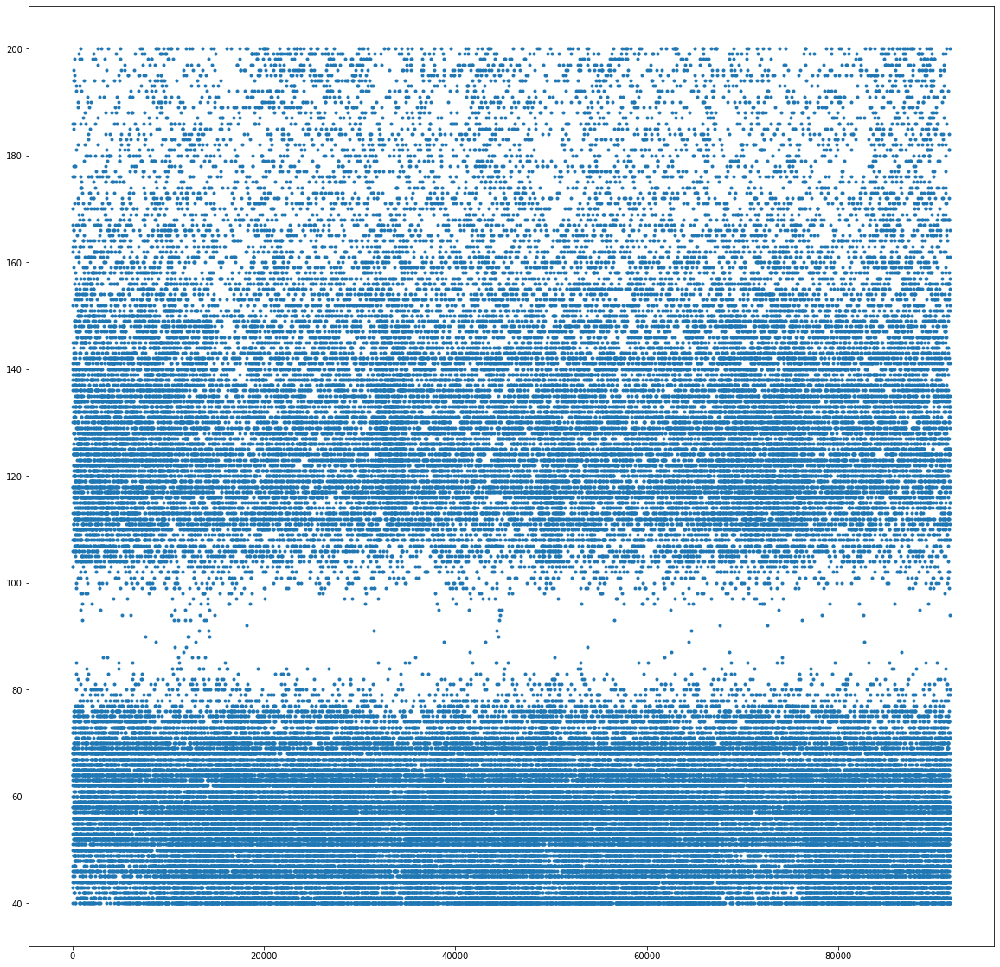

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['map_apache'],'.')
plt.show()

**RESPRATE APACHE**:The respiratory rate measured during the first 24 hours which results in the highest APACHE III score

In [0]:
type(data['resprate_apache'][0])
min(data['resprate_apache']),max(data['resprate_apache'])

(4.0, 60.0)

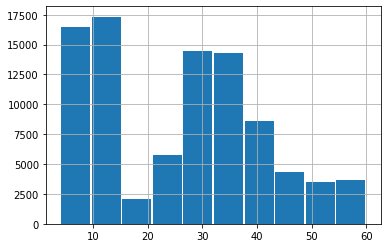

In [0]:
data['resprate_apache'].hist(rwidth=0.95)

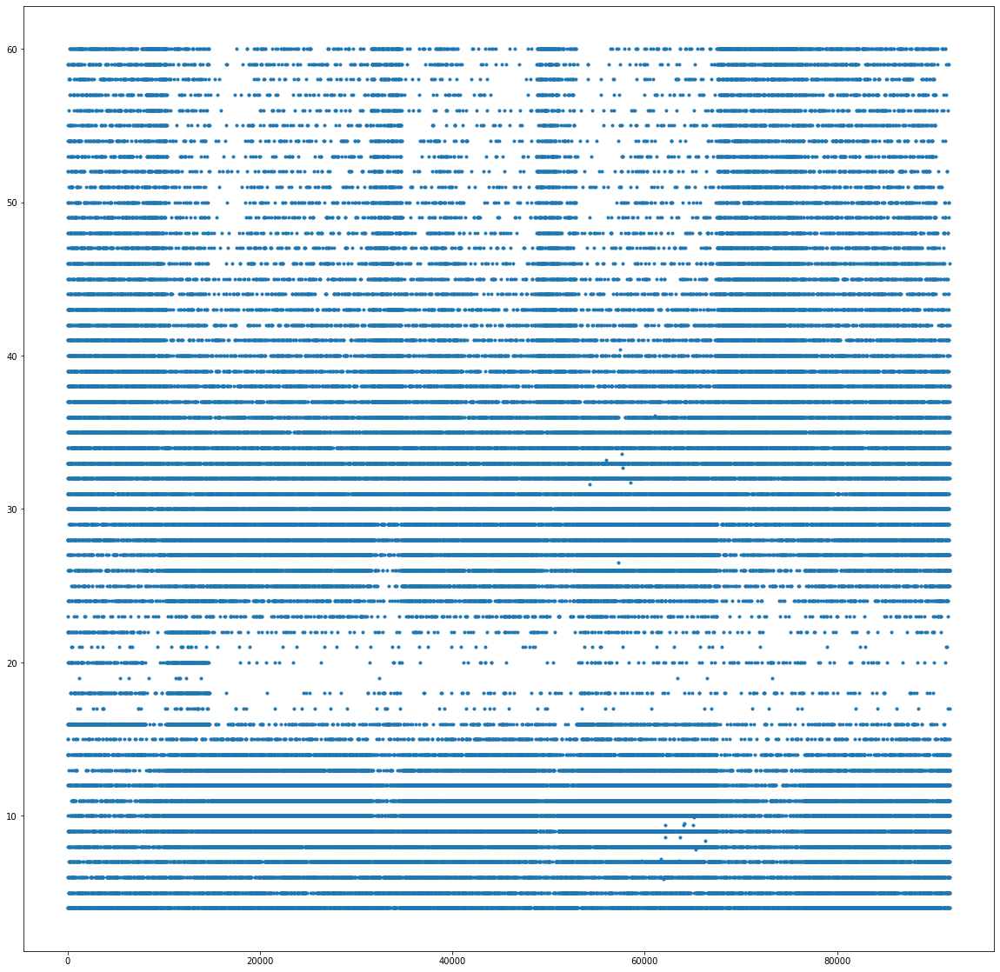

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['resprate_apache'],'.')
plt.show()

**SODIUM APACHE**:The sodium concentration measured during the first 24 hours which results in the highest APACHE III score

(117.0, 158.0)

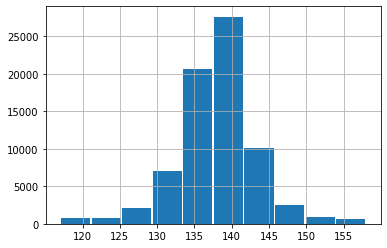

In [0]:
data['sodium_apache'].hist(rwidth=0.95)
min(data['sodium_apache']),max(data['sodium_apache'])

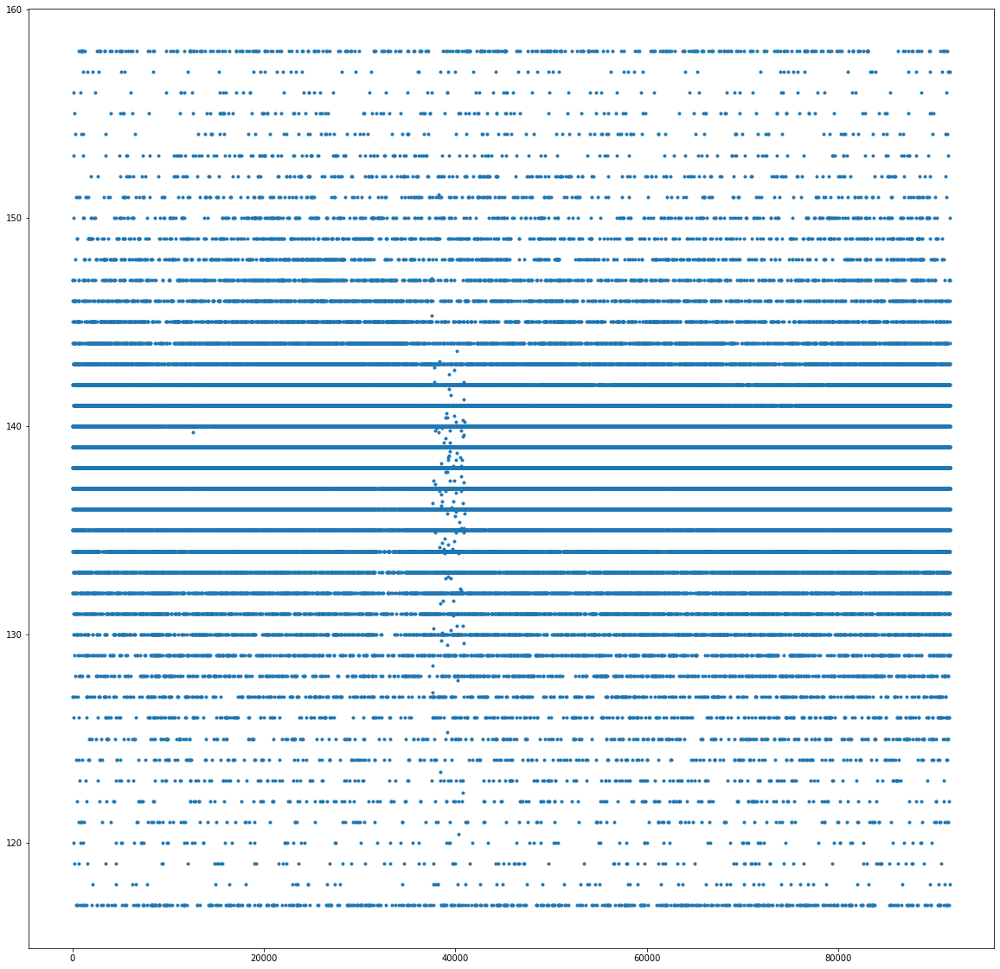

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['sodium_apache'],'.')
plt.show()

**TEMP APACHE**:The temperature measured during the first 24 hours which results in the highest APACHE III score

In [0]:
type(data['temp_apache'][0])
min(data['temp_apache']),max(data['temp_apache'])

(32.1, 39.7)

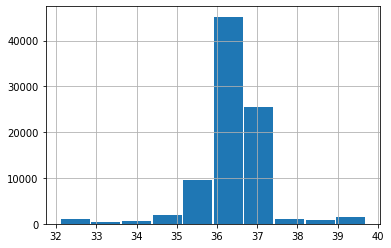

In [0]:
data['temp_apache'].hist(rwidth=0.95)

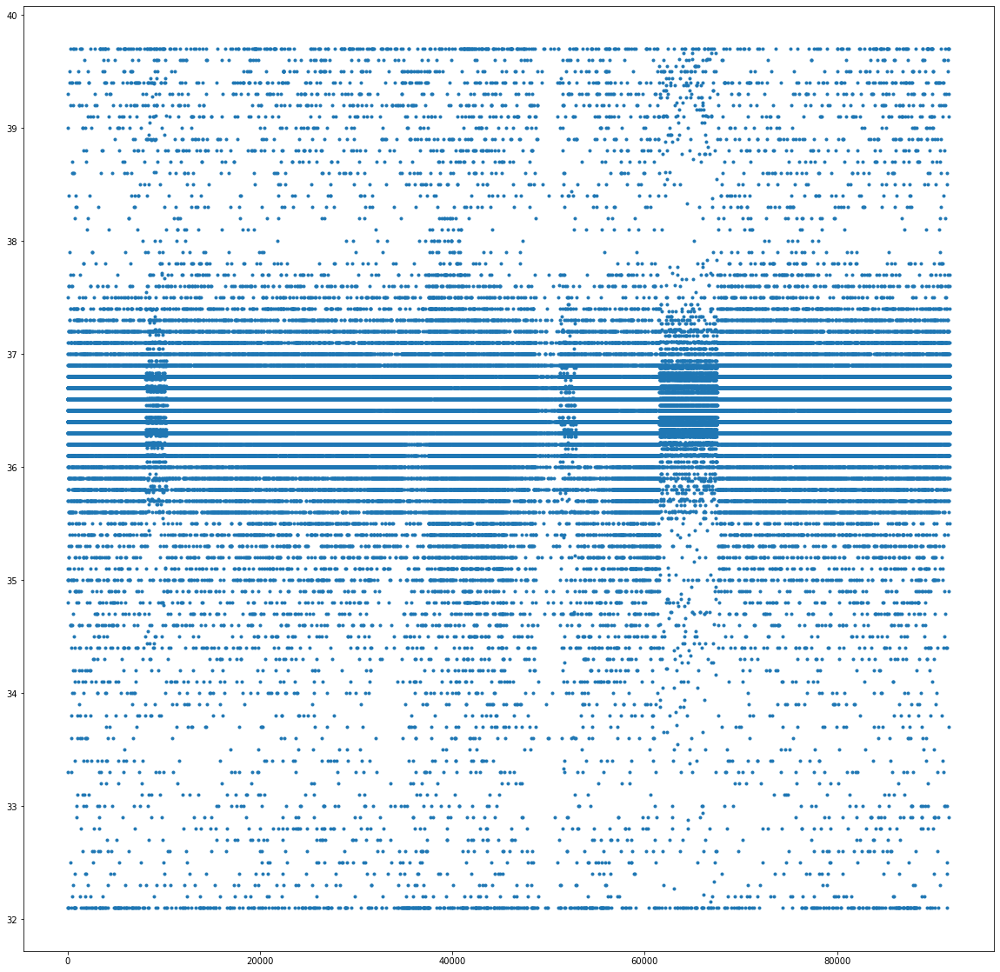

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['temp_apache'],'.')
plt.show()

**VENTILATED APACHE**:Whether the patient was invasively ventilated at the time of the highest scoring arterial blood gas using the oxygenation scoring algorithm, including any mode of positive pressure ventilation deliver...

In [0]:
type(data['ventilated_apache'][0])

numpy.float64

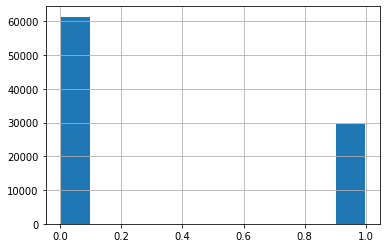

In [0]:
data['ventilated_apache'].hist(rwidth=0.95)

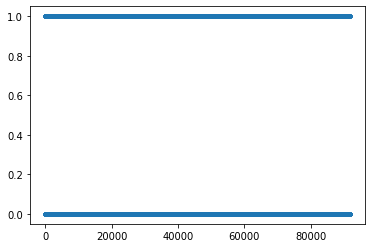

In [0]:
plt.plot(data['ventilated_apache'],'.')
plt.show()

**WBC APACHE**:The white blood cell count measured during the first 24 hours which results in the highest APACHE III score

(0.9, 45.8)

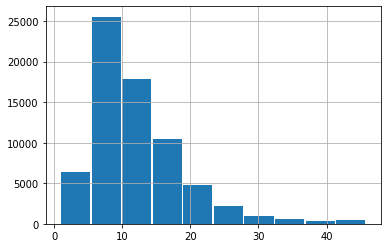

In [0]:
data['wbc_apache'].hist(rwidth=0.95)
min(data['wbc_apache']),max(data['wbc_apache'])

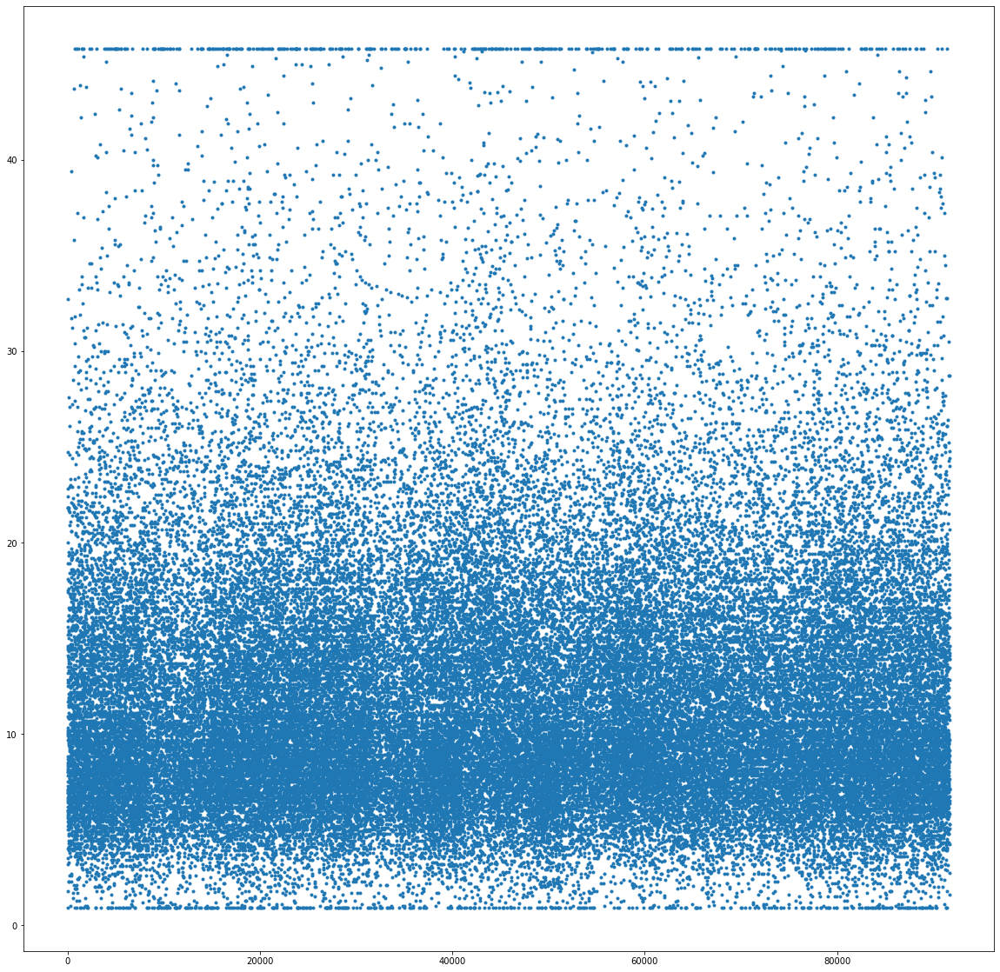

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['wbc_apache'],'.')
plt.show()

**D1 DIASBP MAX**: The patient's highest diastolic blood pressure during the first 24 hours of their unit stay, either non-invasively or invasively measured

(46.0, 165.0)

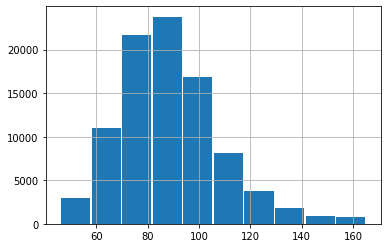

In [0]:
data['d1_diasbp_max'].hist(rwidth=0.95)
min(data['d1_diasbp_max']),max(data['d1_diasbp_max'])

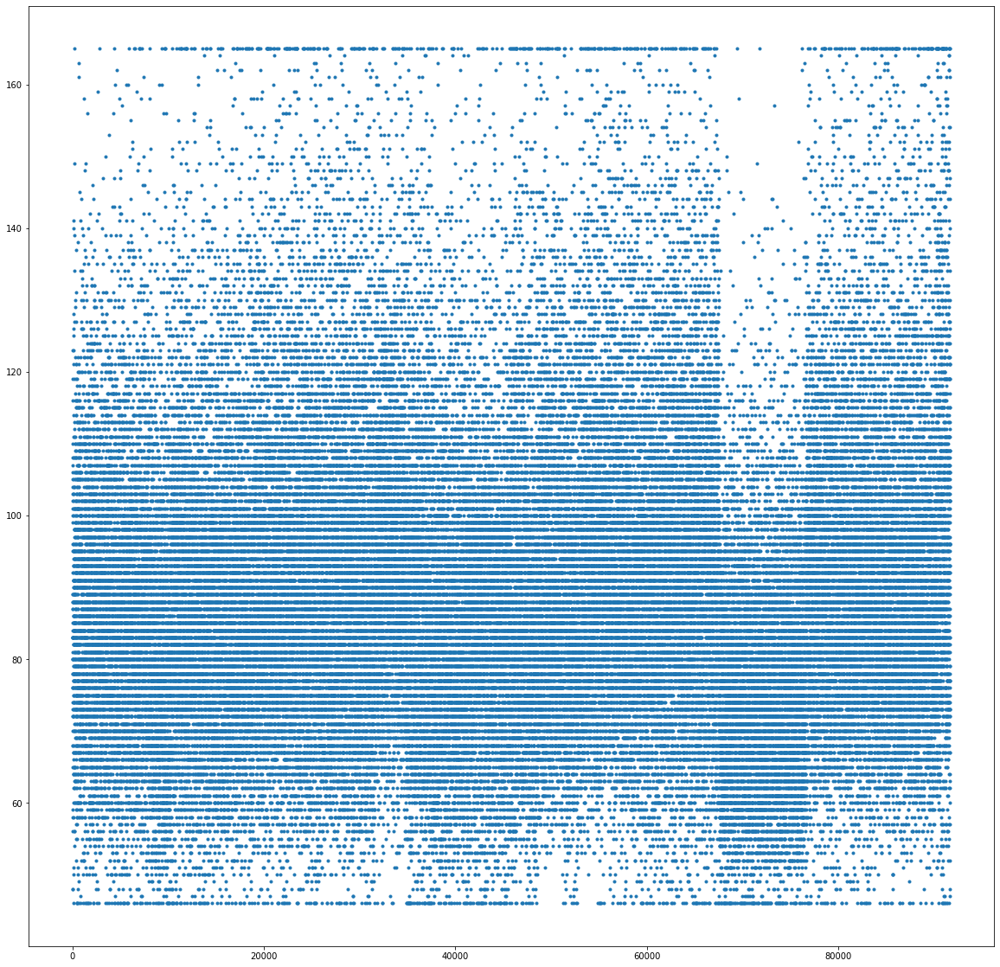

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_diasbp_max'],'.')
plt.show()

**D1 DIASBP MIN**:	The patient's lowest diastolic blood pressure during the first 24 hours of their unit stay, either non-invasively or invasively measured

(13.0, 90.0)

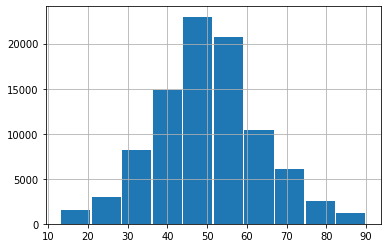

In [0]:
data['d1_diasbp_min'].hist(rwidth=0.95)
min(data['d1_diasbp_min']),max(data['d1_diasbp_min'])

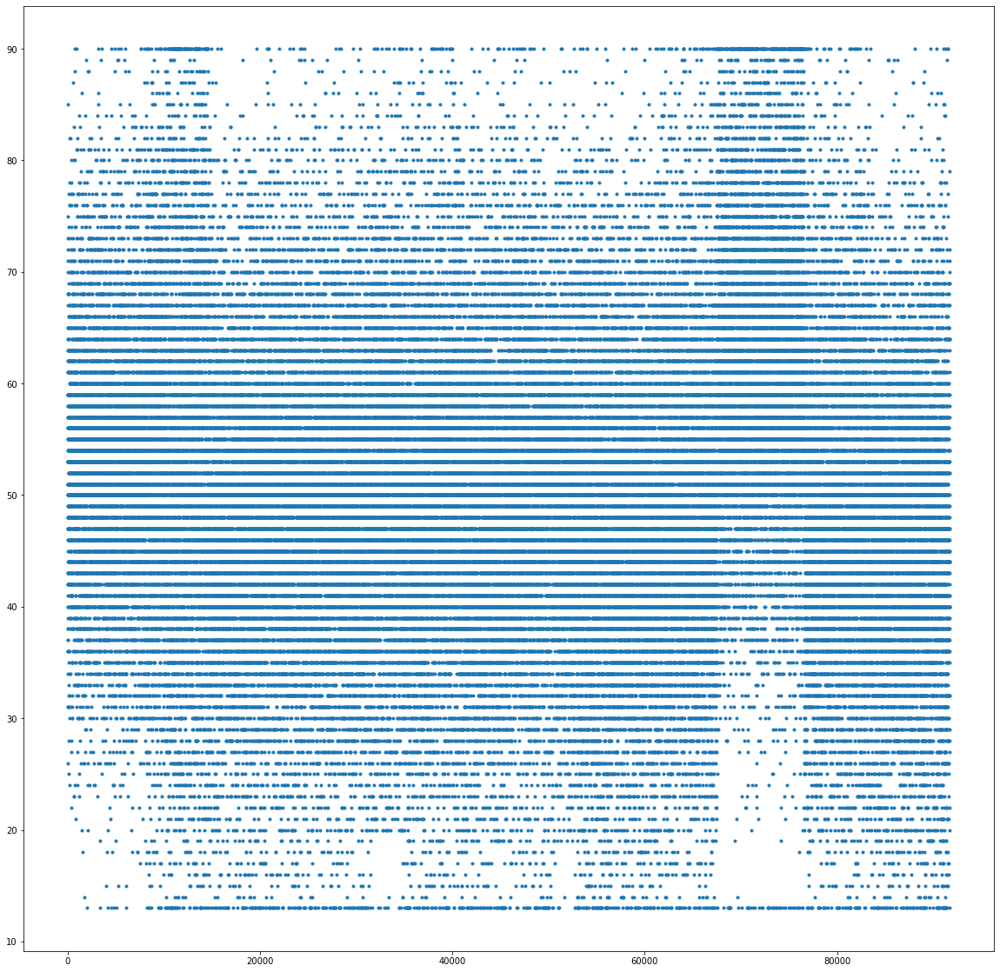

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_diasbp_min'],'.')
plt.show()

**D1 DIASBP NON INVASIVE MAX**:The patient's highest diastolic blood pressure during the first 24 hours of their unit stay, non-invasively measured	

(46.0, 165.0)

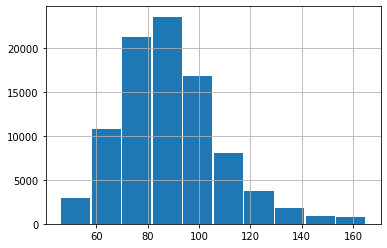

In [0]:
data['d1_diasbp_noninvasive_max'].hist(rwidth=0.95)
min(data['d1_diasbp_noninvasive_max']),max(data['d1_diasbp_noninvasive_max'])

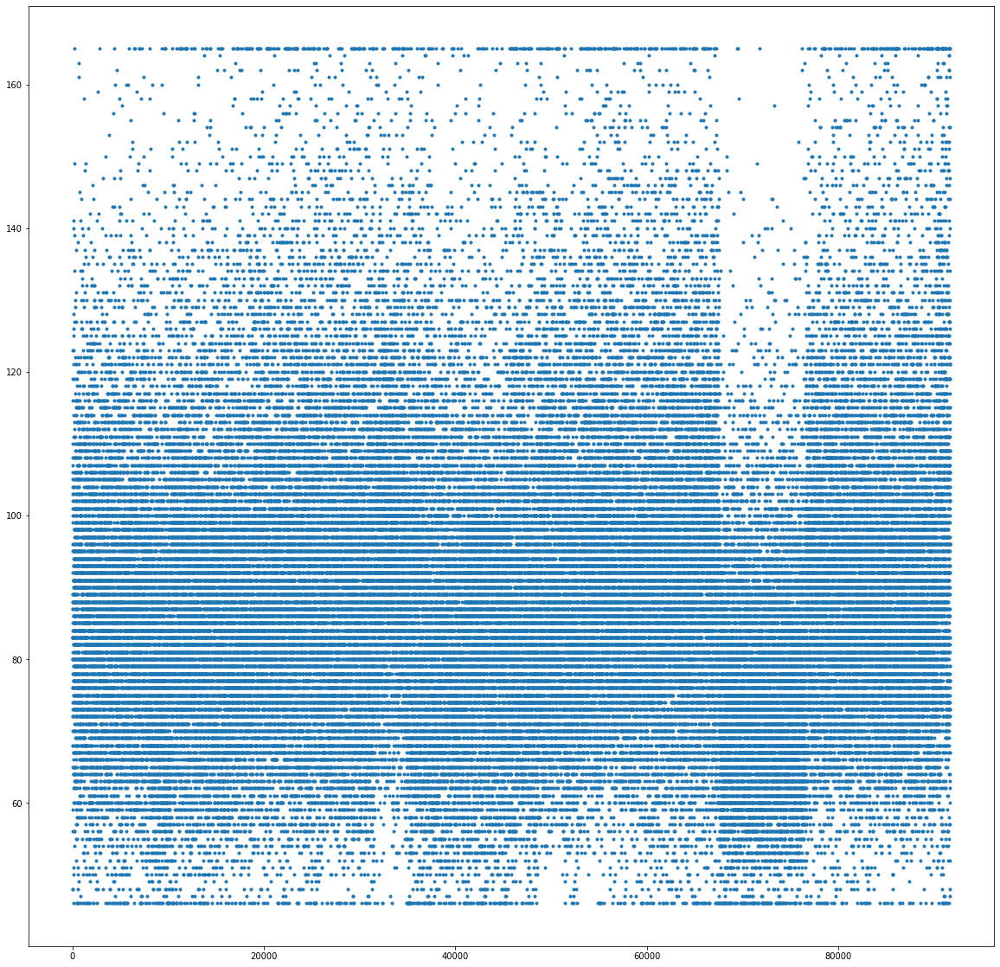

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_diasbp_noninvasive_max'],'.')
plt.show()

**D1 DIASBP NON INVASIVE MIN**:The patient's lowest diastolic blood pressure during the first 24 hours of their unit stay, non-invasively measured	

(13.0, 90.0)

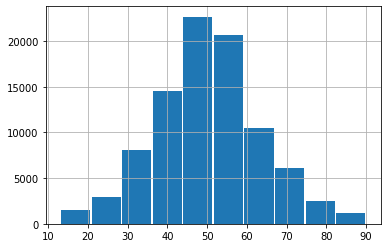

In [0]:
data['d1_diasbp_noninvasive_min'].hist(rwidth=0.95)
min(data['d1_diasbp_noninvasive_min']),max(data['d1_diasbp_noninvasive_min'])

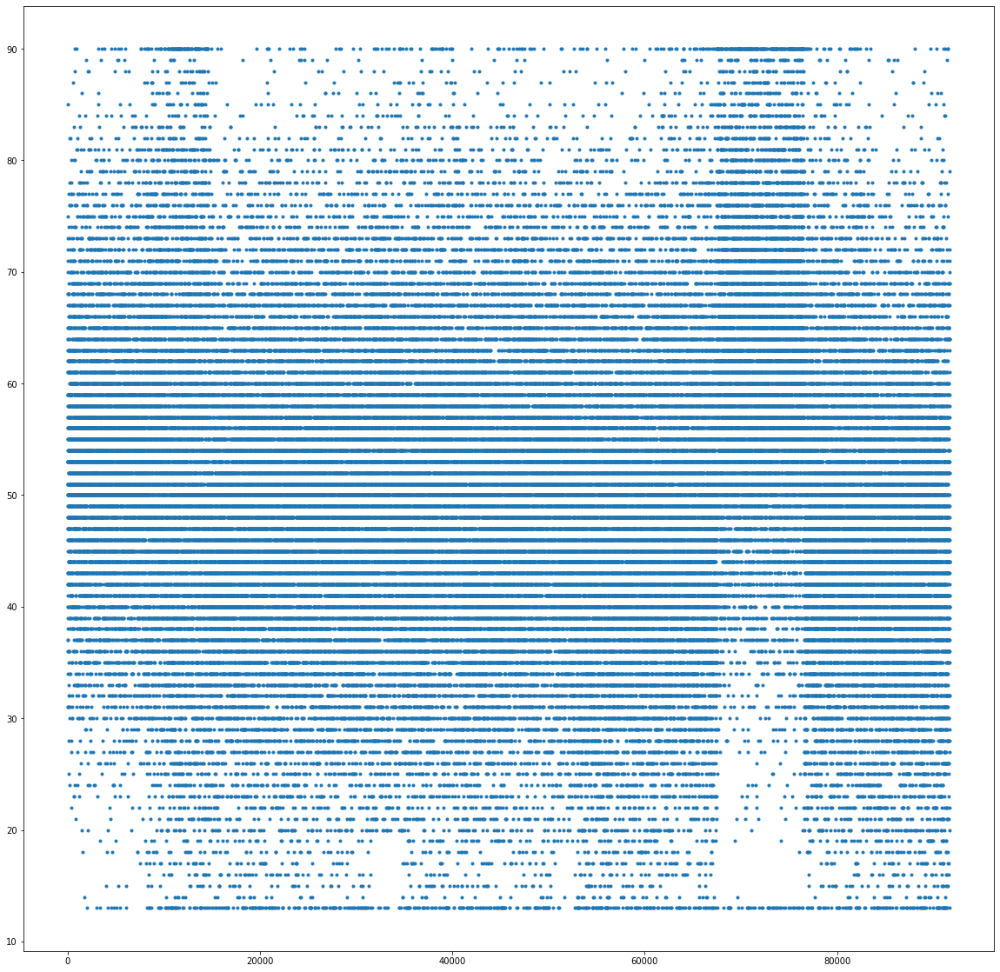

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_diasbp_noninvasive_min'],'.')
plt.show()

**D1 HEARTRATE MAX**:The patient's highest heart rate during the first 24 hours of their unit stay	

(58.0, 177.0)

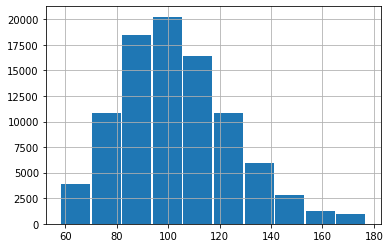

In [0]:
data['d1_heartrate_max'].hist(rwidth=0.95)
min(data['d1_heartrate_max']),max(data['d1_heartrate_max'])

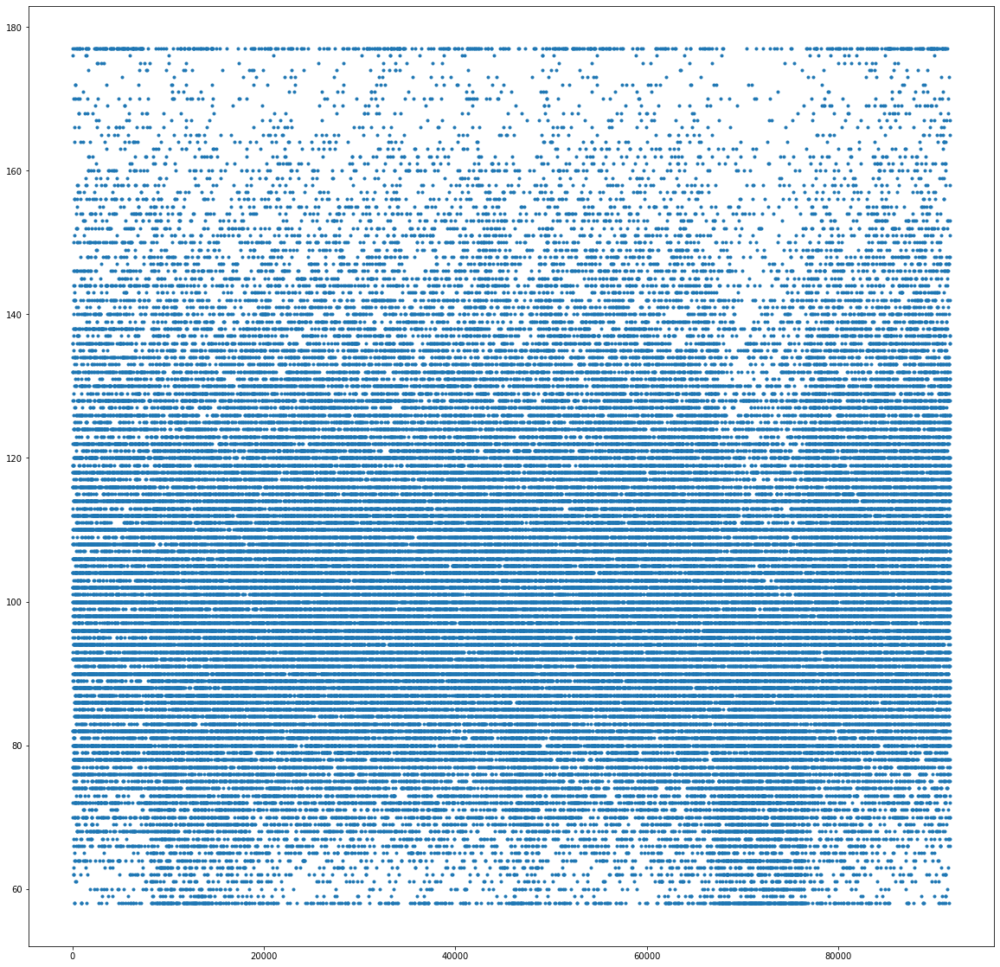

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_heartrate_max'],'.')
plt.show()

**D1 HEARTRATE MIN**:The patient's lowest heart rate during the first 24 hours of their unit stay	

OUTLIERS!!

(0.0, 175.0)

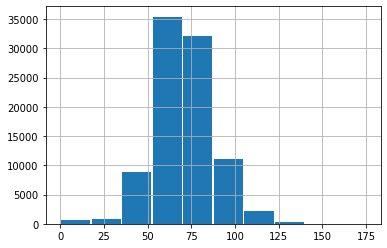

In [0]:
data['d1_heartrate_min'].hist(rwidth=0.95)
min(data['d1_heartrate_min']),max(data['d1_heartrate_min'])

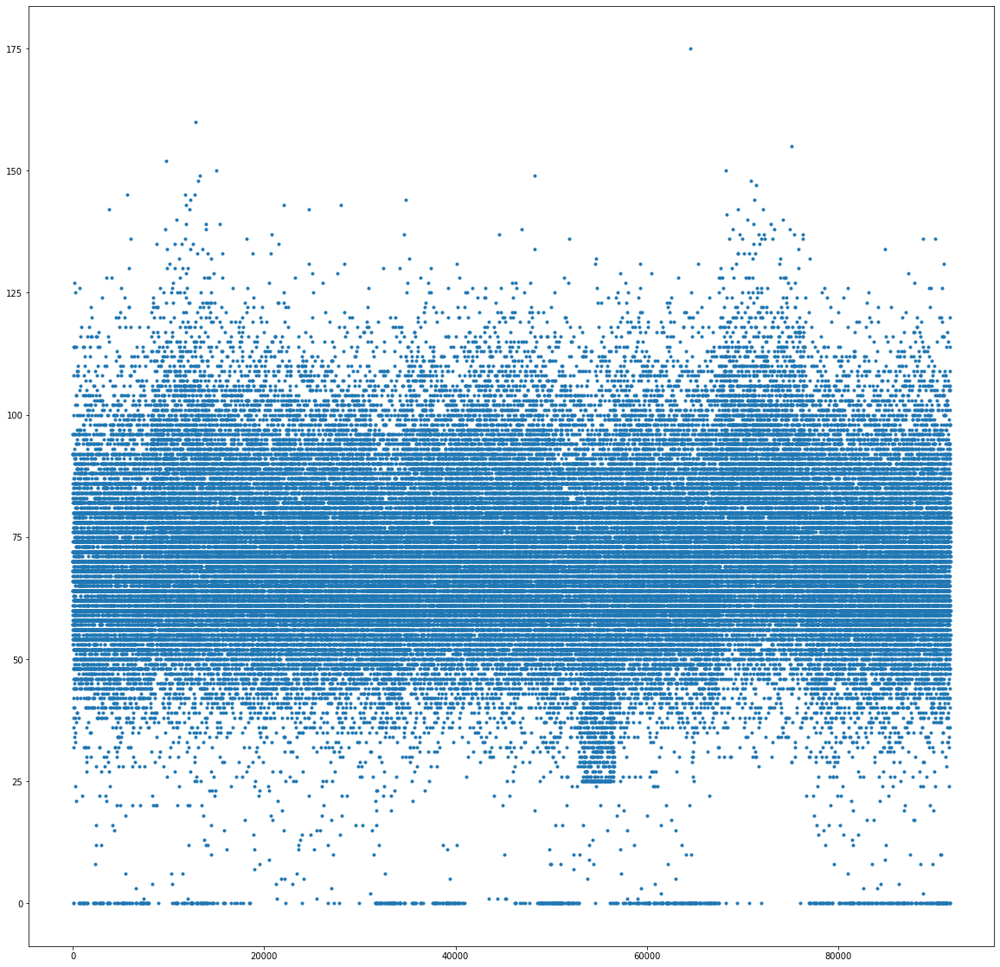

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_heartrate_min'],'.')
plt.show()

**D1 MBP MAX**:The patient's highest mean blood pressure during the first 24 hours of their unit stay, either non-invasively or invasively measured	

(60.0, 184.0)

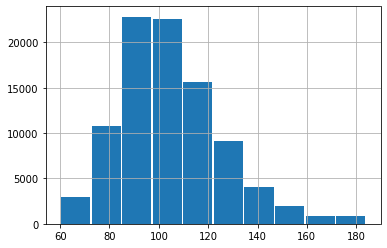

In [0]:
data['d1_mbp_max'].hist(rwidth=0.95)
min(data['d1_mbp_max']),max(data['d1_mbp_max'])

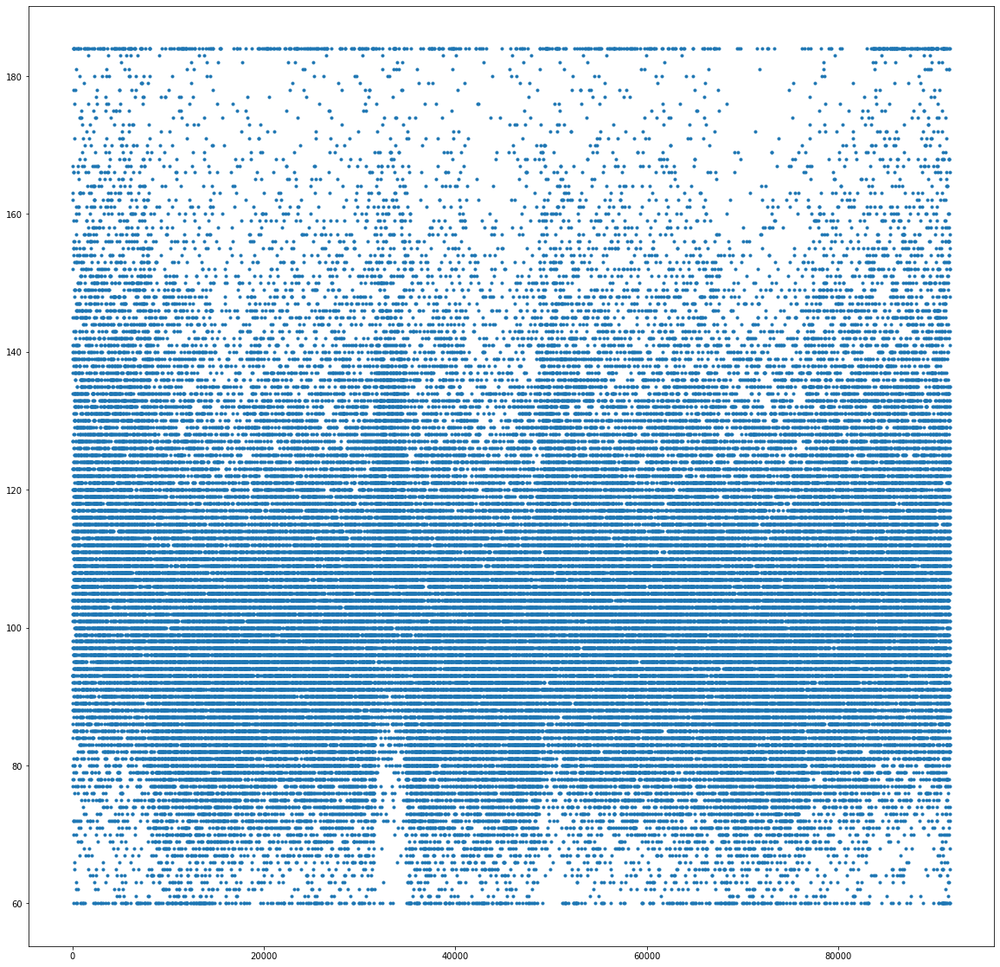

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_mbp_max'],'.')
plt.show()

**D1 MBP MIN**: The patient's lowest mean blood pressure during the first 24 hours of their unit stay, either non-invasively or invasively measured	

(22.0, 112.0)

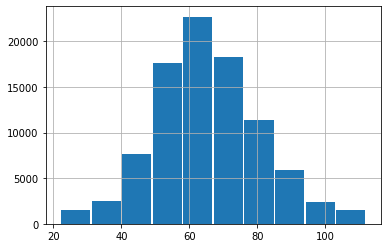

In [0]:
data['d1_mbp_min'].hist(rwidth=0.95)
min(data['d1_mbp_min']),max(data['d1_mbp_min'])

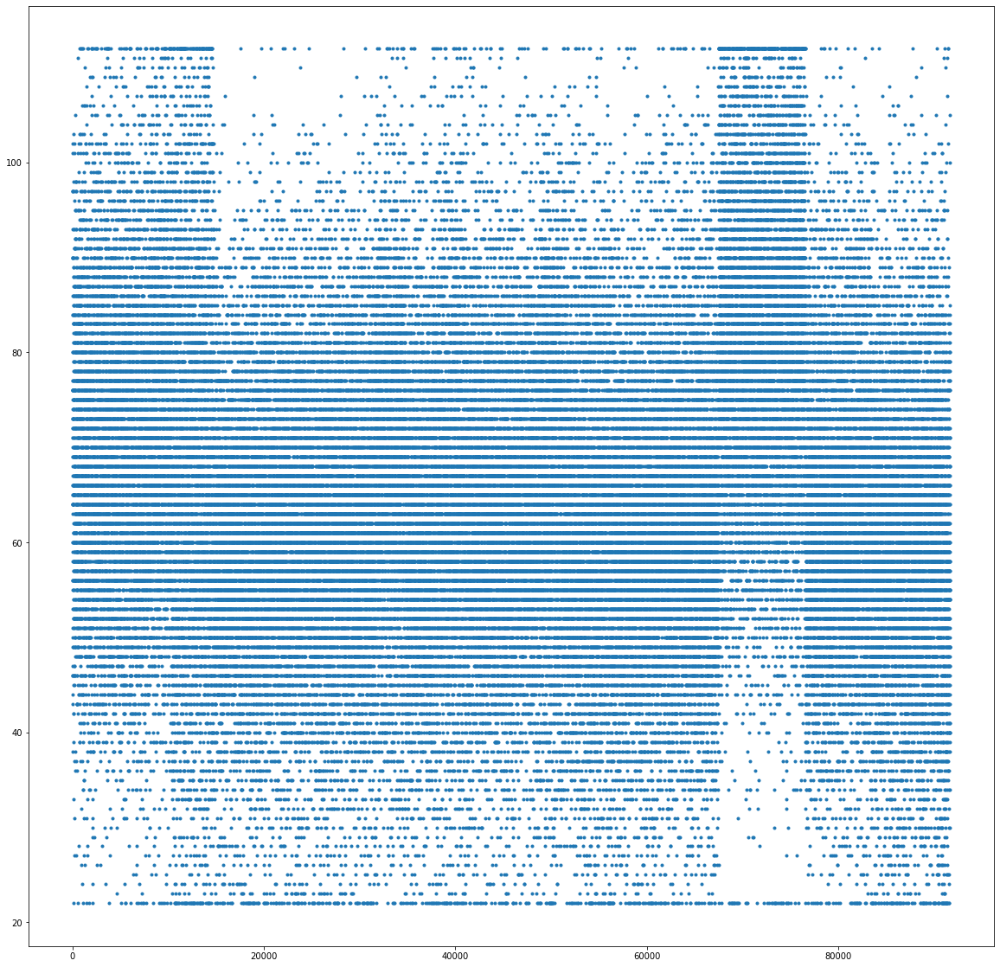

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_mbp_min'],'.')
plt.show()

**D1 MBP NONINVASIVE MAX**:The patient's highest mean blood pressure during the first 24 hours of their unit stay, non-invasively measured	

(60.0, 181.0)

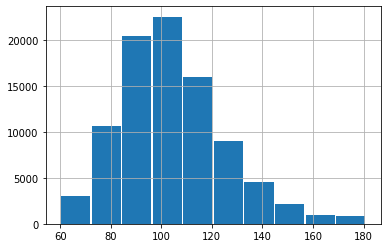

In [0]:
data['d1_mbp_noninvasive_max'].hist(rwidth=0.95)
min(data['d1_mbp_noninvasive_max']),max(data['d1_mbp_noninvasive_max'])

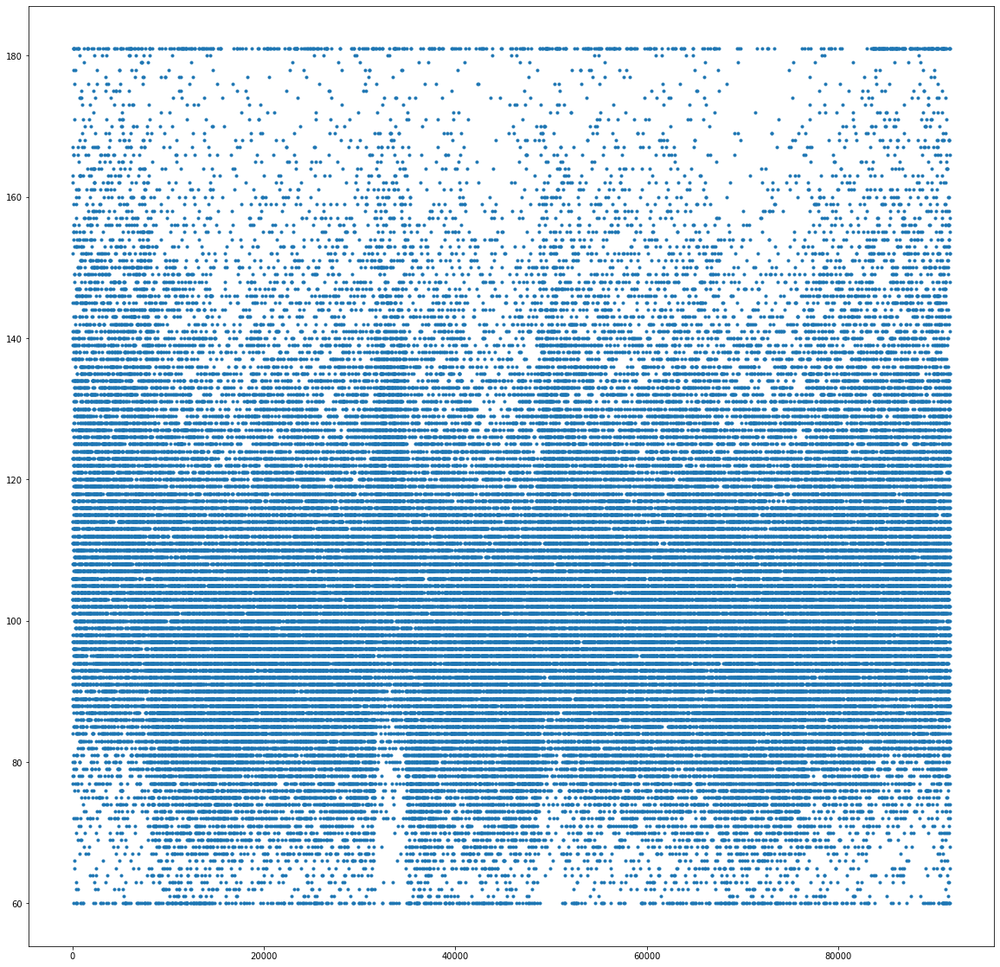

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_mbp_noninvasive_max'],'.')
plt.show()

**D1 MBP NONINVASIVE MIN**:The patient's lowest mean blood pressure during the first 24 hours of their unit stay, non-invasively measured	

(22.0, 112.0)

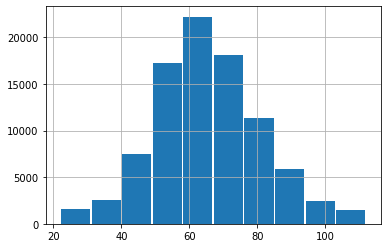

In [0]:
data['d1_mbp_noninvasive_min'].hist(rwidth=0.95)
min(data['d1_mbp_noninvasive_min']),max(data['d1_mbp_noninvasive_min'])

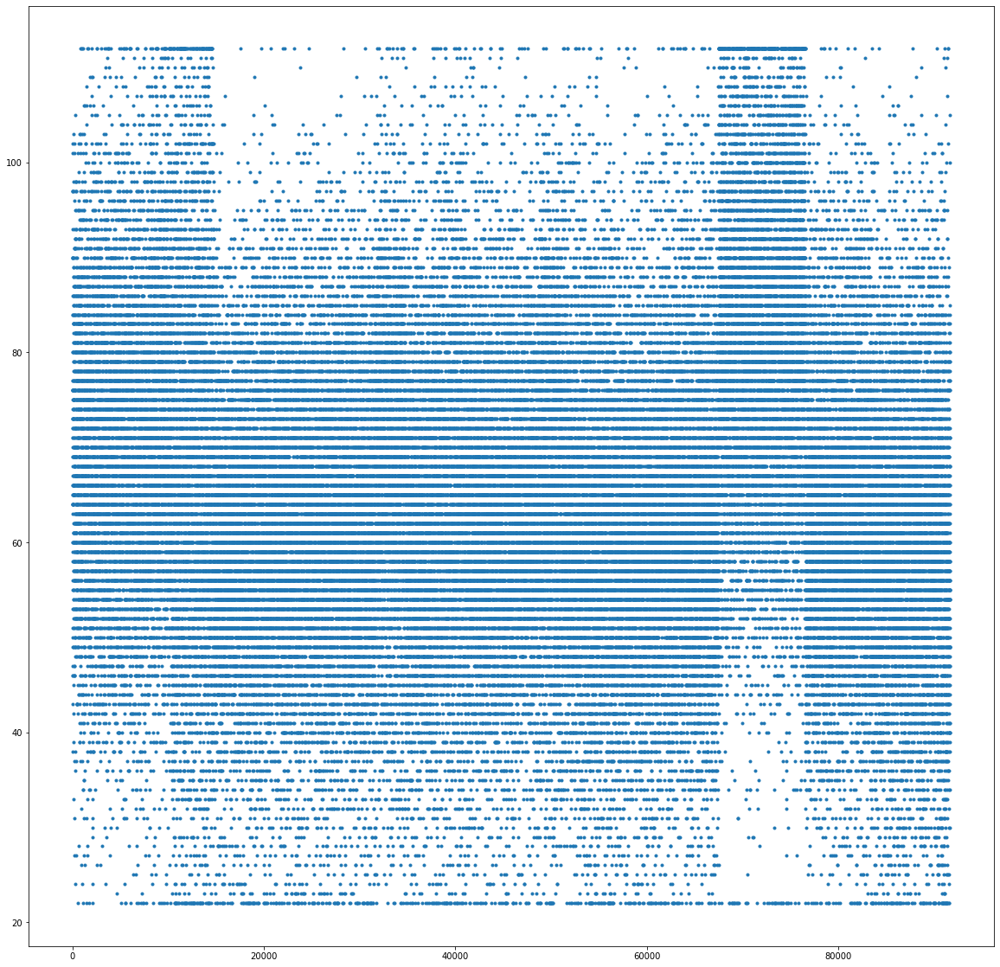

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_mbp_noninvasive_min'],'.')
plt.show()

**D1 RESPRATE MAX**: The patient's highest respiratory rate during the first 24 hours of their unit stay	

(14.0, 92.0)

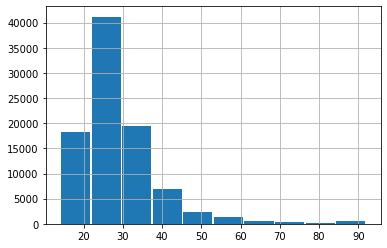

In [0]:
data['d1_resprate_max'].hist(rwidth=0.95)
min(data['d1_resprate_max']),max(data['d1_resprate_max'])

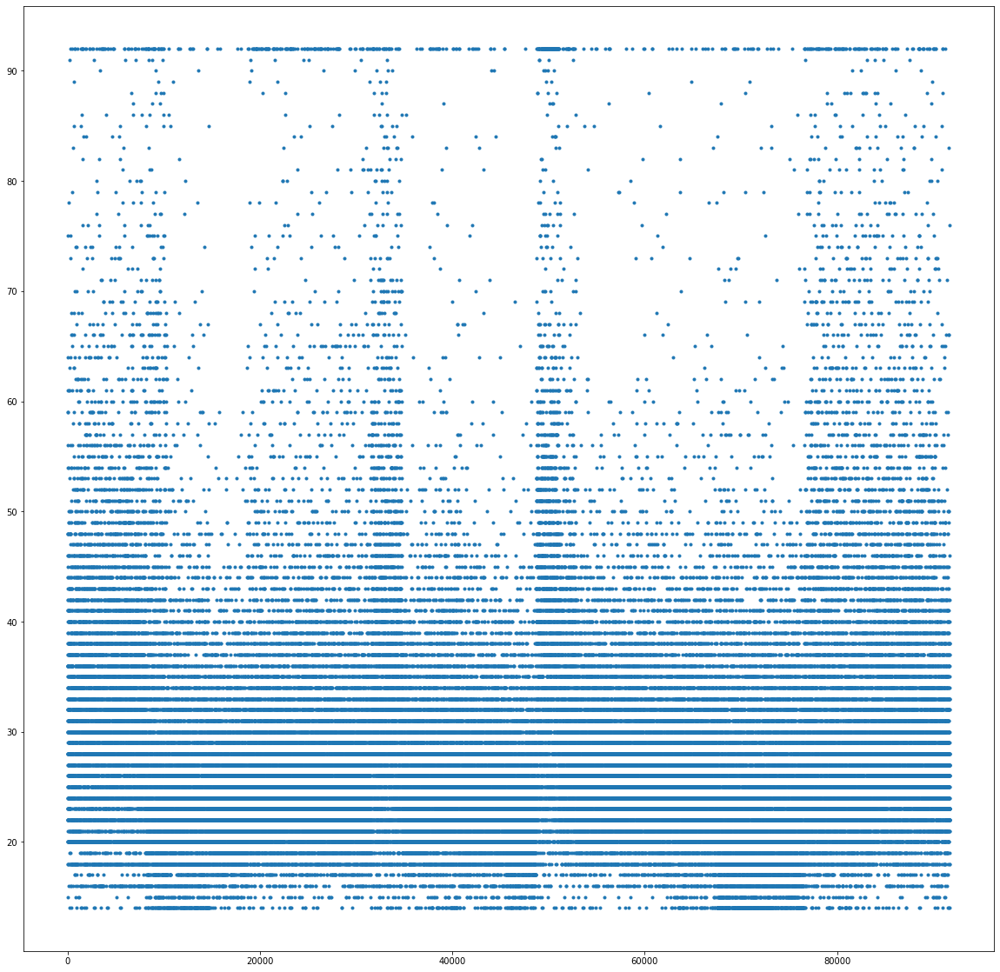

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_resprate_max'],'.')
plt.show()

**D1 RESPRATE MIN**: The patient's lowest respiratory rate during the first 24 hours of their unit stay	

# Variables de la 75 a la 110

**d1_hco3_min**: The lowest bicarbonate concentration for the patient in their serum or plasma during the first 24 hours of their unit stay

(7.0, 39.0)

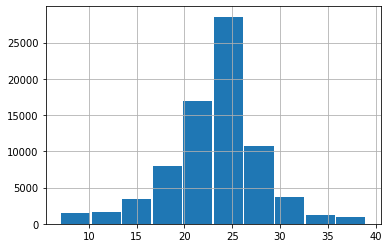

In [0]:
data['d1_hco3_min'].hist(rwidth=0.95)
min(data['d1_hco3_min']),max(data['d1_hco3_min'])

La distribución sigue una normal, giran en torno a los 25 mEq/L siendo los valores normales de 22 a 28 miliequivalentes por litro (mEq/L). **Hay valores extremos.**

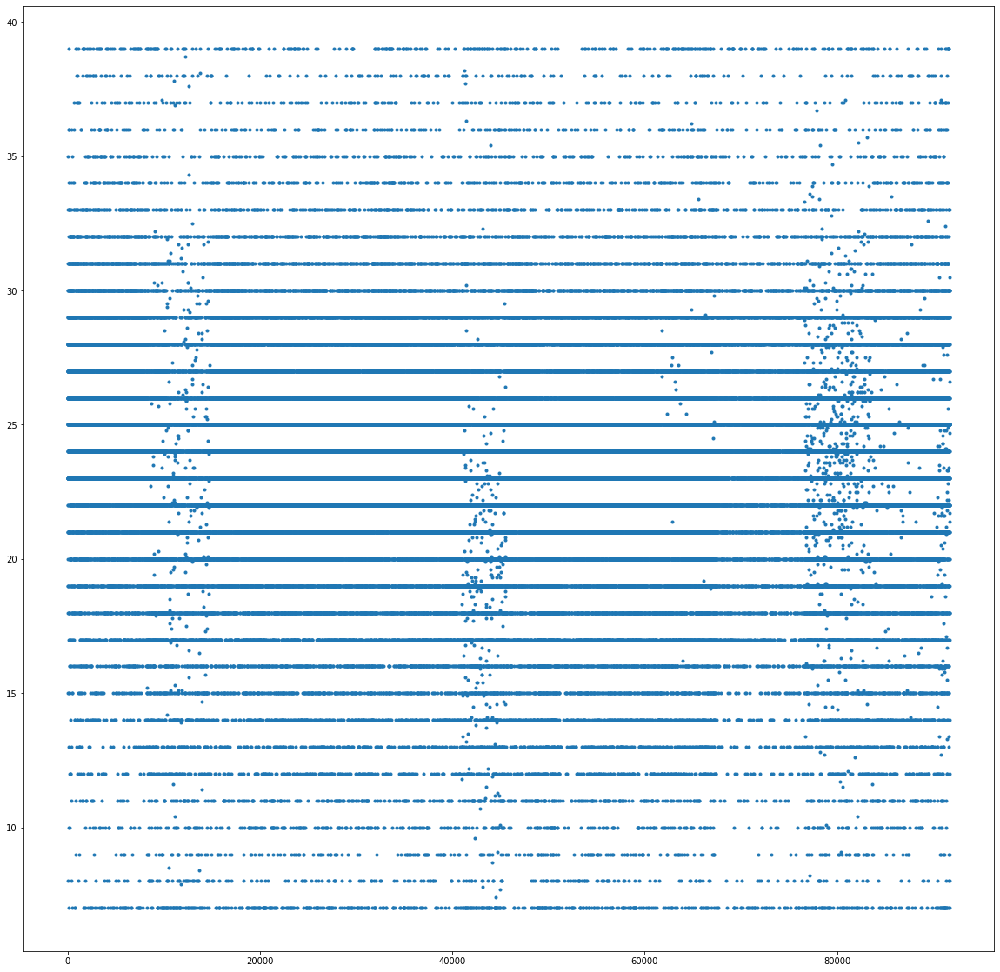

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_hco3_min'],'.')
plt.show()

Como tiene una distribución normal, con un claro pico en el valor más frecuente. sustituyo los valores perdidos por ese valor.

In [0]:
df_thresh['d1_hco3_min'].isna().sum()

15071

In [0]:
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
df_d1_hco3_min = pd.DataFrame(data['d1_hco3_min'])

df_d1_hco3_min = pd.DataFrame(imputer.fit_transform(df_d1_hco3_min))
df_d1_hco3_min.columns = ['d1_hco3_min']
df_thresh['d1_hco3_min'] = df_d1_hco3_min

df_thresh['d1_hco3_min'].isna().sum()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0

**d1_hemaglobin_max**: The highest hemoglobin concentration for the patient during the first 24 hours of their unit stay


(6.8, 17.2)

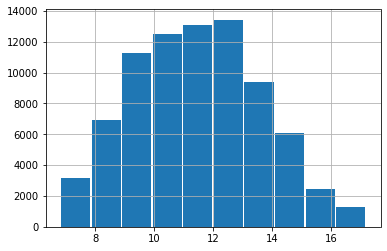

In [0]:
data['d1_hemaglobin_max'].hist(rwidth=0.95)
min(data['d1_hemaglobin_max']),max(data['d1_hemaglobin_max'])

The normal range for hemoglobin is: For men, 13.5 to 17.5 grams per deciliter. For women, 12.0 to 15.5 grams per deciliter.

**IMPORTANTE: Hay muchos pacientes con niveles de hemoglobina bajos --> anemia, pérdida de sangre etc**

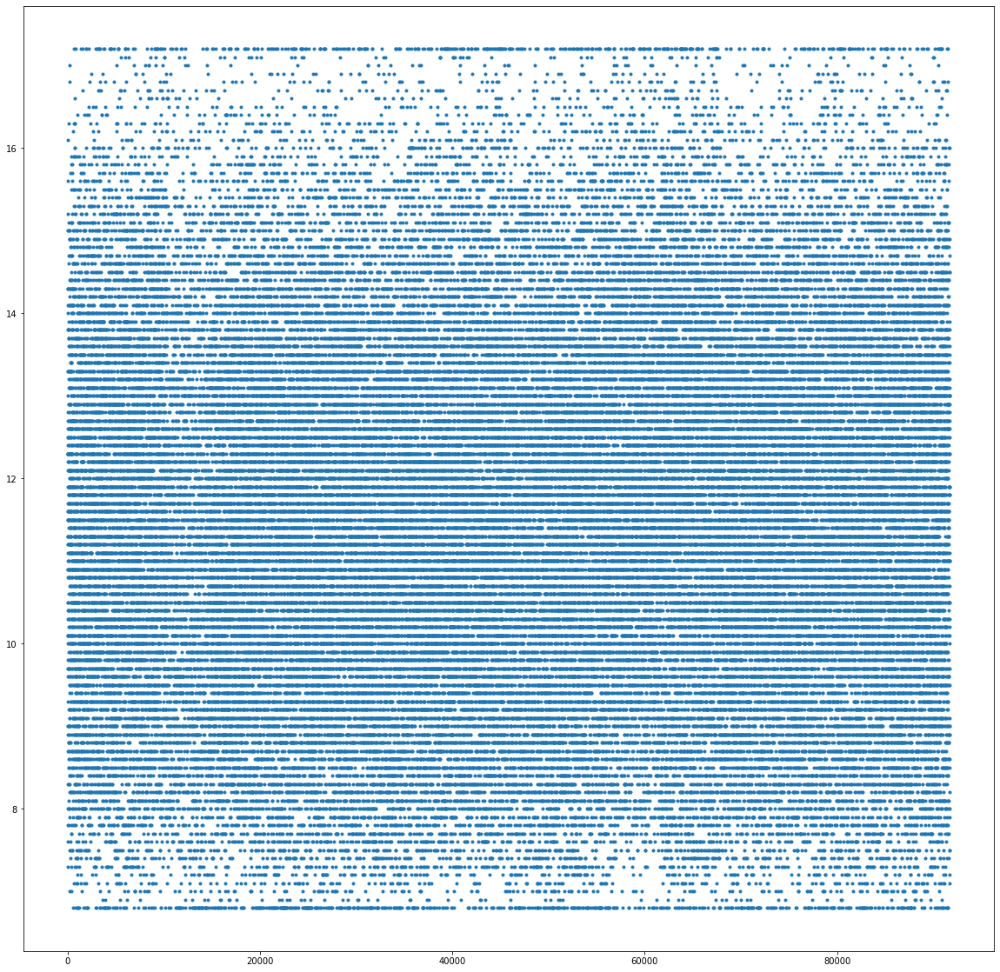

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_hemaglobin_max'],'.')
plt.show()

In [0]:
df_thresh['d1_hemaglobin_max'].isna().sum()

12147

**d1_hemaglobin_min**: The lowest hemoglobin concentration for the patient during the first 24 hours of their unit stay

(5.3, 16.7)

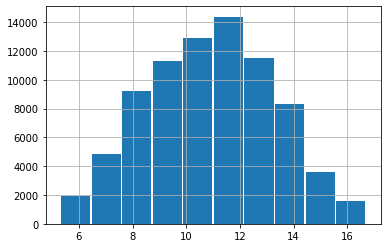

In [0]:
data['d1_hemaglobin_min'].hist(rwidth=0.95)
min(data['d1_hemaglobin_min']),max(data['d1_hemaglobin_min'])

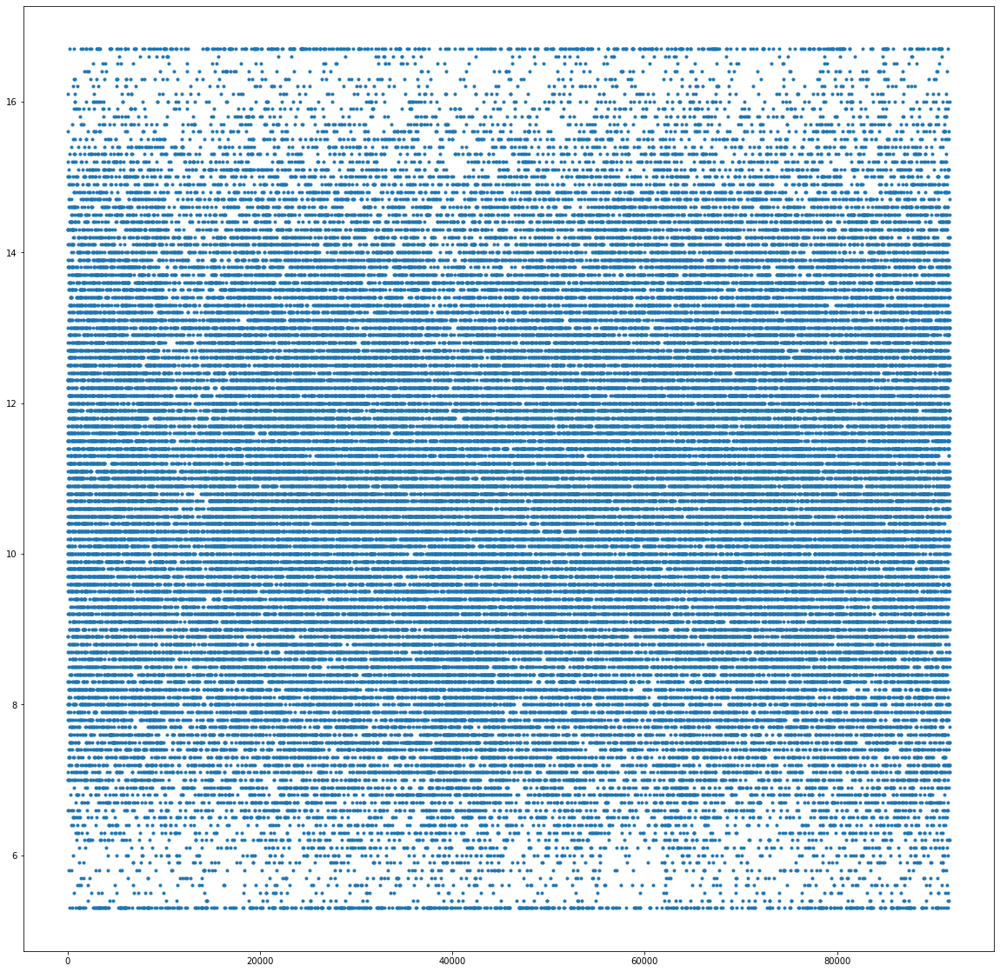

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_hemaglobin_min'],'.')
plt.show()

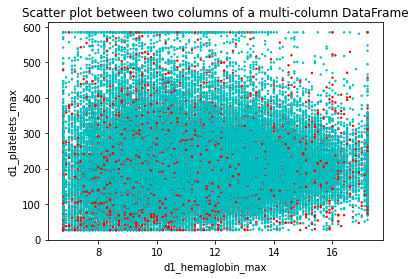

In [0]:
colors = np.where(df_thresh['hospital_death'] == 1, 'r', 'c')
df_thresh.plot.scatter(x='d1_hemaglobin_max', y='d1_platelets_max', title= "Scatter plot between two columns of a multi-column DataFrame", s= 2, c=colors);

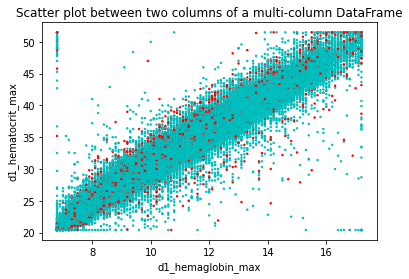

In [0]:
df_thresh.plot.scatter(x='d1_hemaglobin_max', y='d1_hematocrit_max', title= "Scatter plot between two columns of a multi-column DataFrame", s= 2, c=colors);

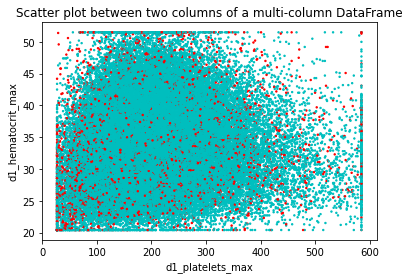

In [0]:
df_thresh.plot.scatter(x='d1_platelets_max', y='d1_hematocrit_max', title= "Scatter plot between two columns of a multi-column DataFrame", s= 2, c=colors);

**d1_hematocrit_max**: The highest volume proportion of red blood cells in a patient's blood during the first 24 hours of their unit stay, expressed as a fraction

(20.4, 51.5)

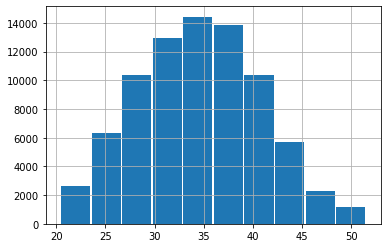

In [0]:
data['d1_hematocrit_max'].hist(rwidth=0.95)
min(data['d1_hematocrit_max']),max(data['d1_hematocrit_max'])

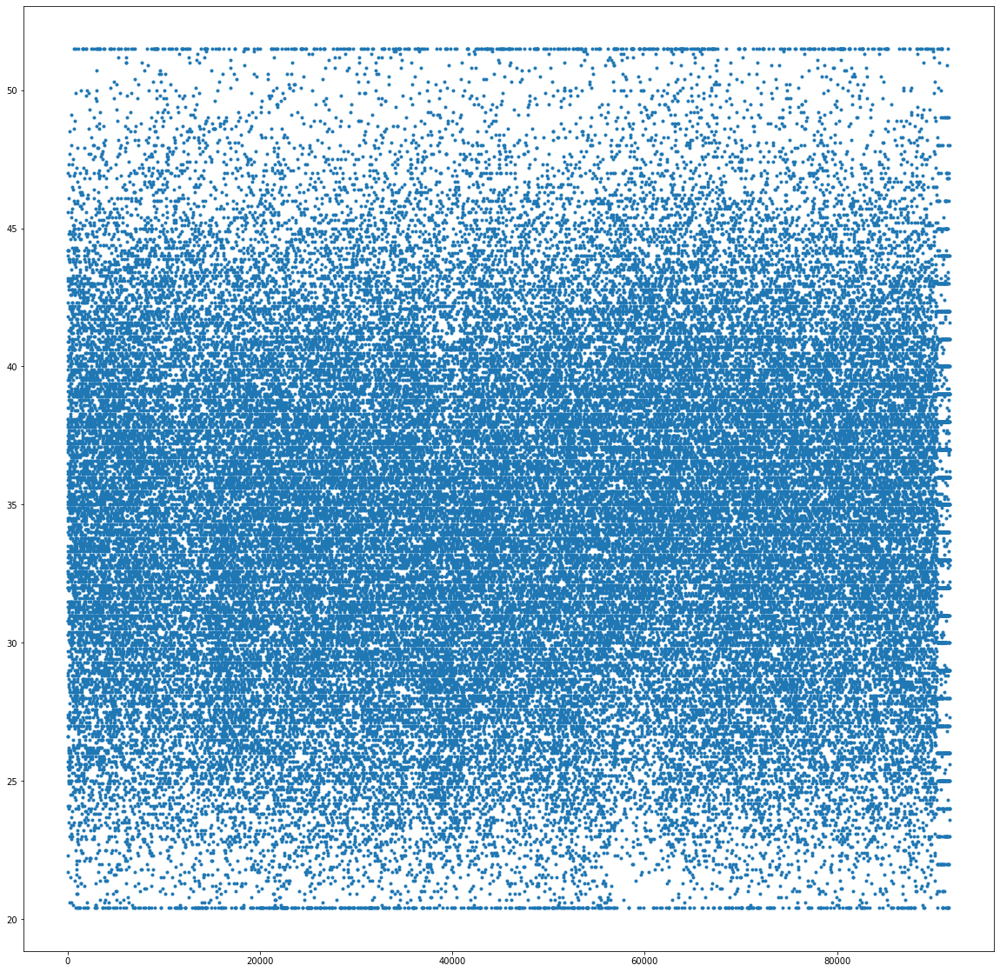

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_hematocrit_max'],'.')
plt.show()

**d1_hematocrit_min**: The lowest volume proportion of red blood cells in a patient's blood during the first 24 hours of their unit stay, expressed as a fraction


(20.4, 50.0)

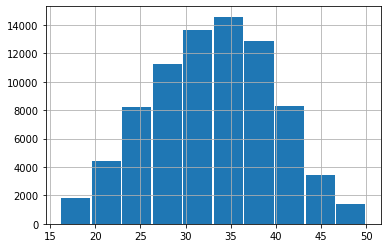

In [0]:
data['d1_hematocrit_min'].hist(rwidth=0.95)
min(data['d1_hematocrit_max']),max(data['d1_hematocrit_min'])

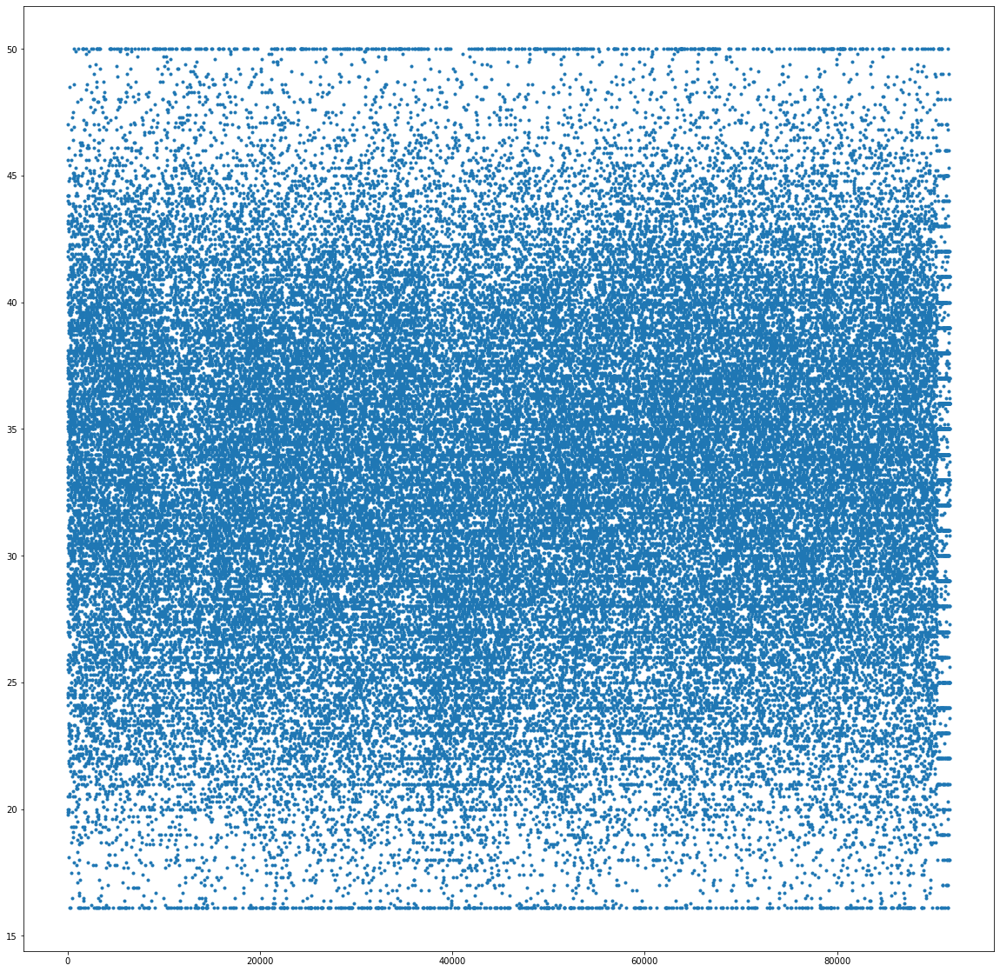

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_hematocrit_min'],'.')
plt.show()

**d1_platelets_max**: The highest platelet count for the patient during the first 24 hours of their unit stay La cantidad normal de plaquetas en la sangre es de 150,000 a 400,000 por microlitro (mcL) o 150 a 400 × 109/L

(27.0, 585.0)

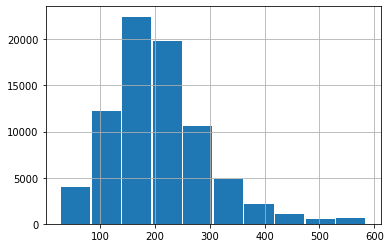

In [0]:
data['d1_platelets_max'].hist(rwidth=0.95)
min(data['d1_platelets_max']),max(data['d1_platelets_max'])

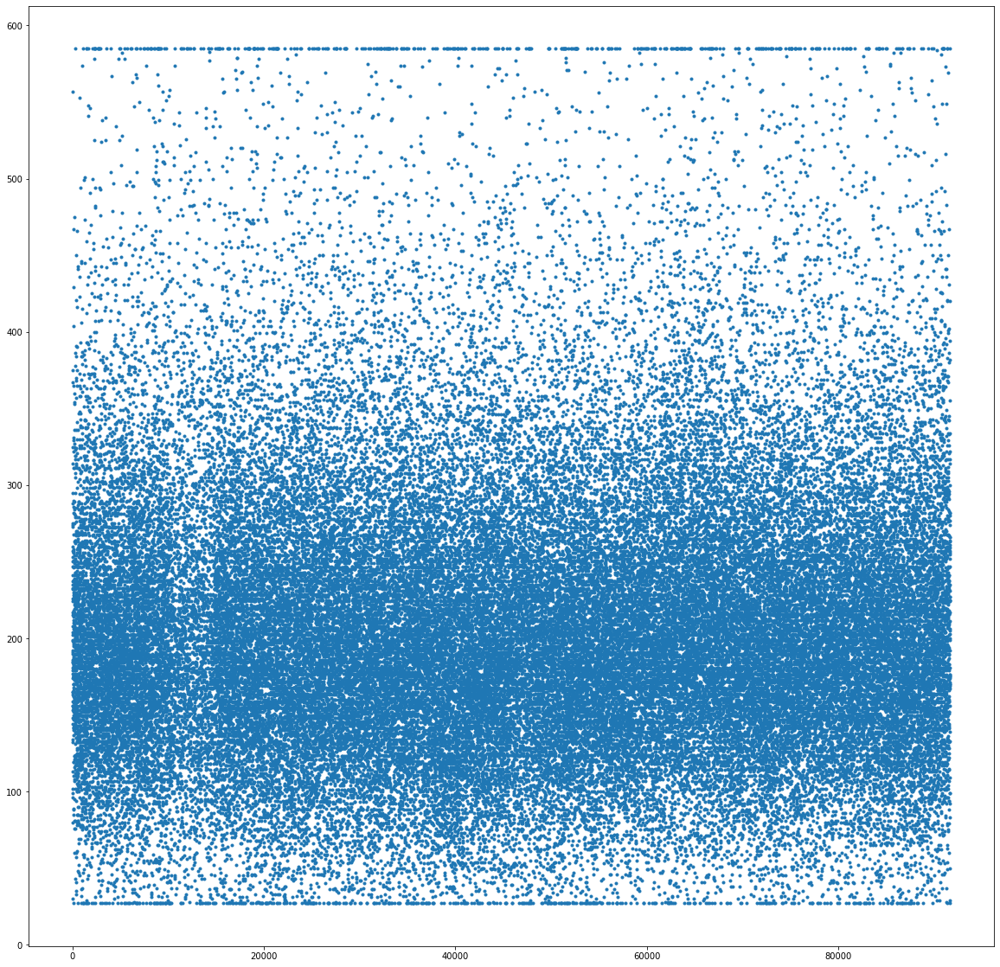

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_platelets_max'],'.')
plt.show()

**d1_platelets_min**: The lowest platelet count for the patient during the first 24 hours of their unit stay



(18.55, 557.45)

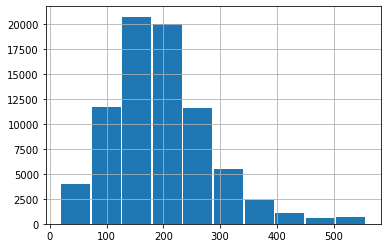

In [0]:
data['d1_platelets_min'].hist(rwidth=0.95)
min(data['d1_platelets_min']),max(data['d1_platelets_min'])

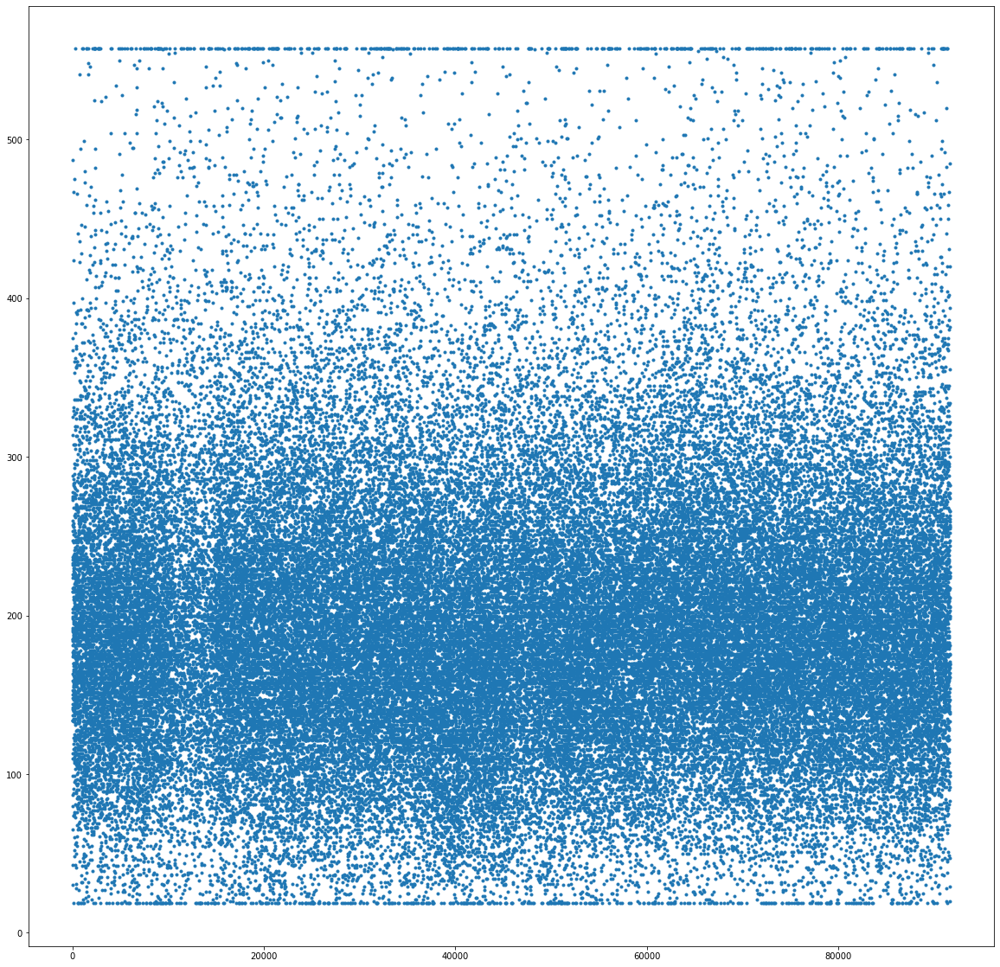

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_platelets_min'],'.')
plt.show()

**d1_potassium_max**:The highest potassium concentration for the patient in their serum or plasma during the first 24 hours of their unit stay.

El valor normal de potasio en los adultos es de 3,5 a 5,3 mEq/L.

Potasio ALTO: normalmente el exceso de potasio es causado por una insuficiencia renal, diabetes tipo I, síndrome nefrótico y cirrosis.

Potasio BAJO: uso de medicamentos como la insulina, salbutamol y teofilina, vómitos y diarreas prolongadas, hipertiroidismo e hiperaldosteronismo, uso crónico y excesivo de laxantes, síndrome de cushing y, muy rara vez, está asociado con la alimentación. 

(2.8, 7.0)

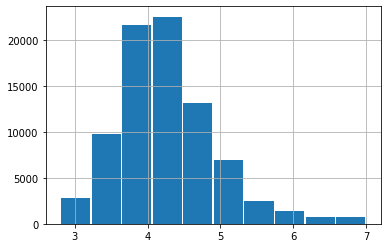

In [0]:
data['d1_potassium_max'].hist(rwidth=0.95)
min(data['d1_potassium_max']),max(data['d1_potassium_max'])

**IMPORTANTE: Hay valores extremos**

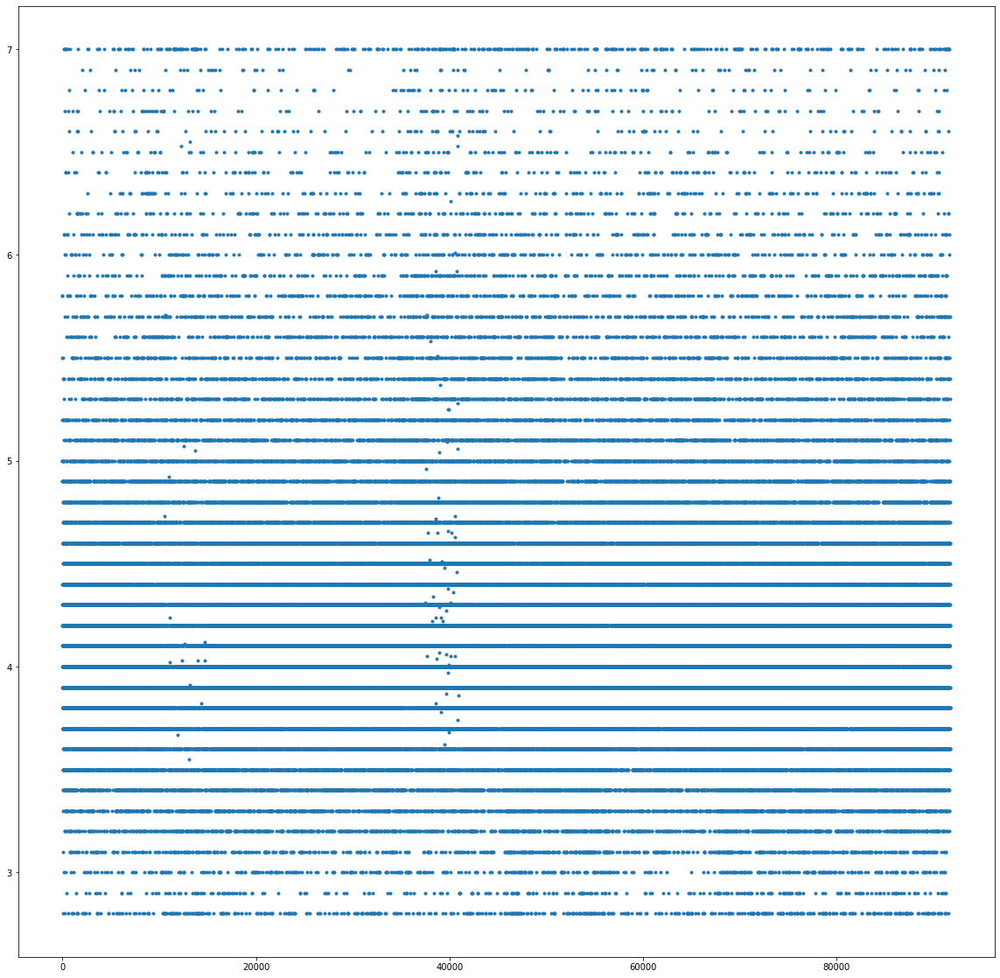

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_potassium_max'],'.')
plt.show()

**d1_potassium_min**: The lowest potassium concentration for the patient in their serum or plasma during the first 24 hours of their unit stay.

(2.4, 5.8)

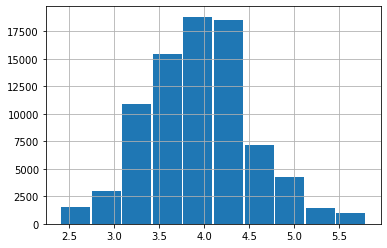

In [0]:
data['d1_potassium_min'].hist(rwidth=0.95)
min(data['d1_potassium_min']),max(data['d1_potassium_min'])

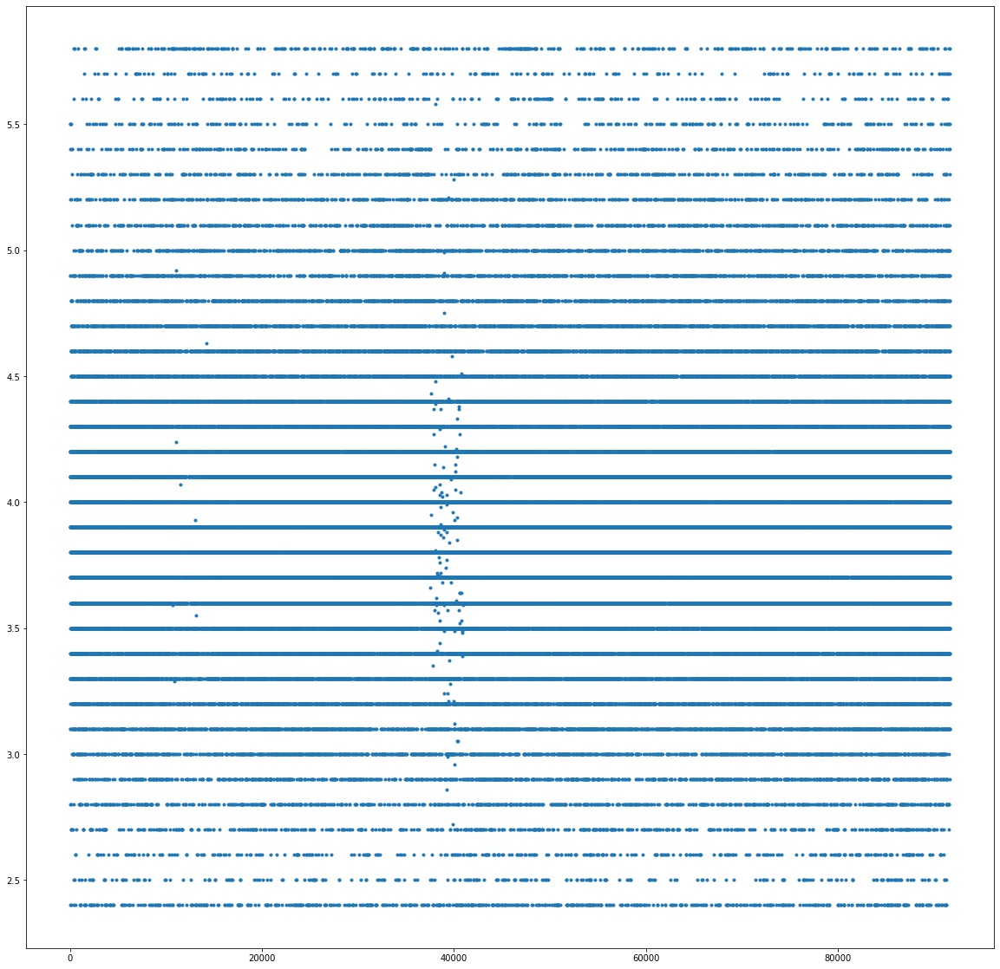

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_potassium_min'],'.')
plt.show()

**d1_sodium_max**:The highest sodium concentration for the patient in their serum or plasma during the first 24 hours of their unit stay. El valor normal de sodio en los adultos es de 136 a 145 mEq/L

(123.0, 158.0)

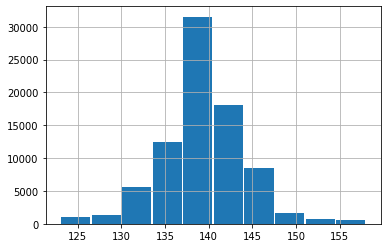

In [0]:
data['d1_sodium_max'].hist(rwidth=0.95)
min(data['d1_sodium_max']),max(data['d1_sodium_max'])

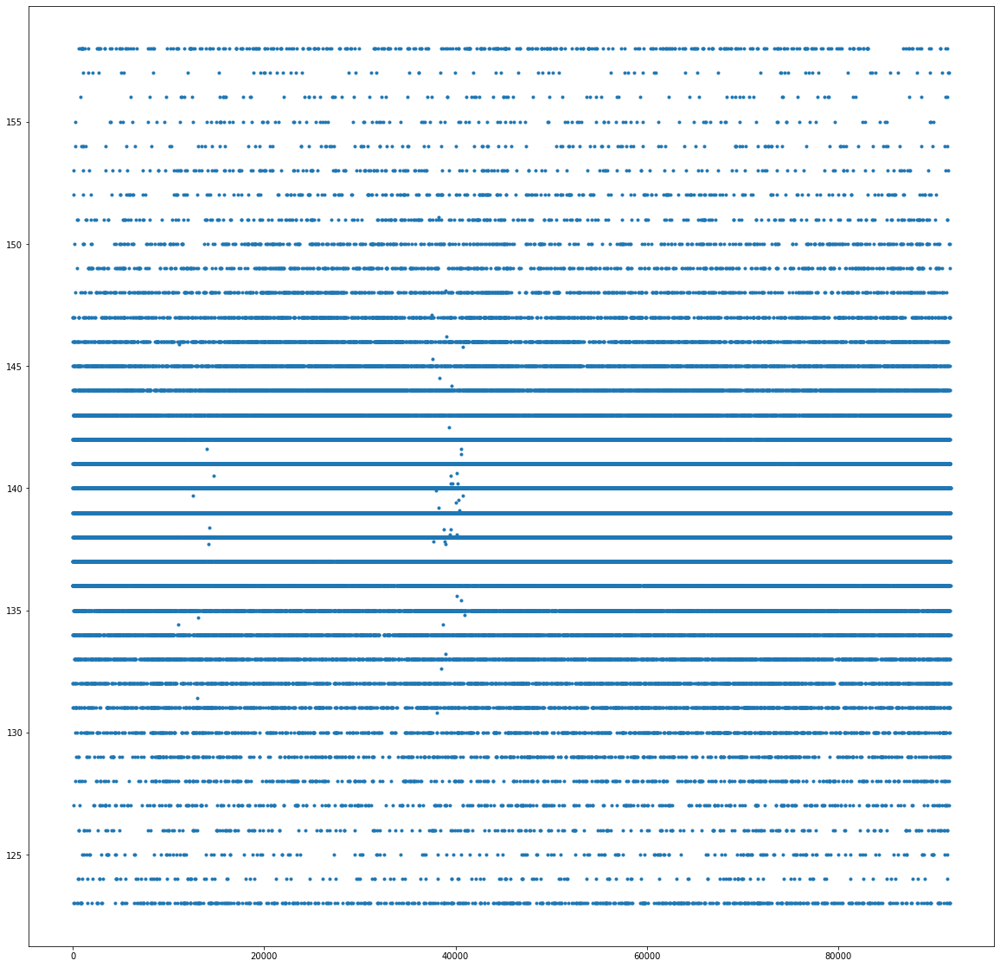

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_sodium_max'],'.')
plt.show()

**d1_sodium_min**

(117.0, 153.0)

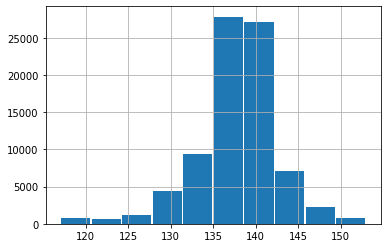

In [0]:
data['d1_sodium_min'].hist(rwidth=0.95)
min(data['d1_sodium_min']),max(data['d1_sodium_min'])

Entre sodium_max y sodium_min la distribución varía.

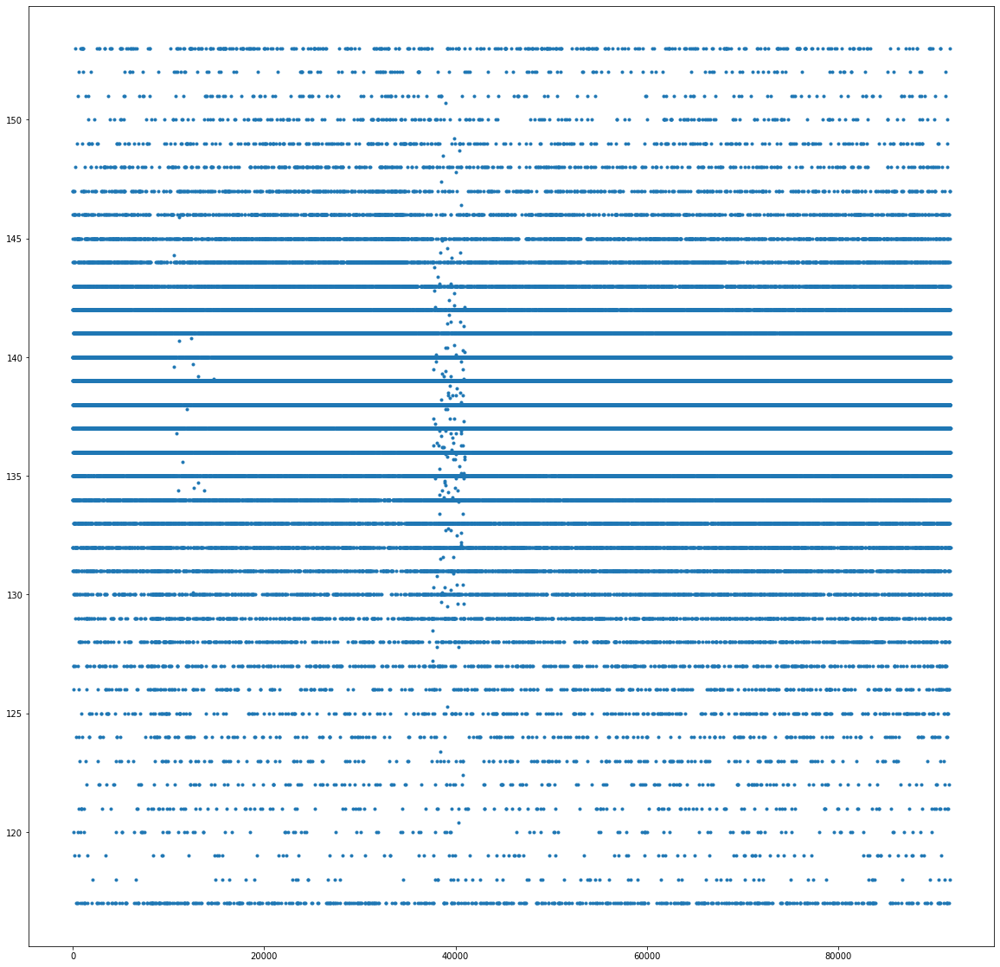

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_sodium_min'],'.')
plt.show()

**d1_wbc_max**: The highest white blood cell count for the patient during the first 24 hours of their unit stay

(1.2, 46.08)

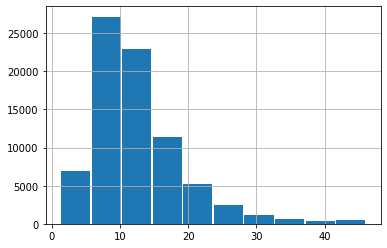

In [0]:
data['d1_wbc_max'].hist(rwidth=0.95)
min(data['d1_wbc_max']),max(data['d1_wbc_max'])

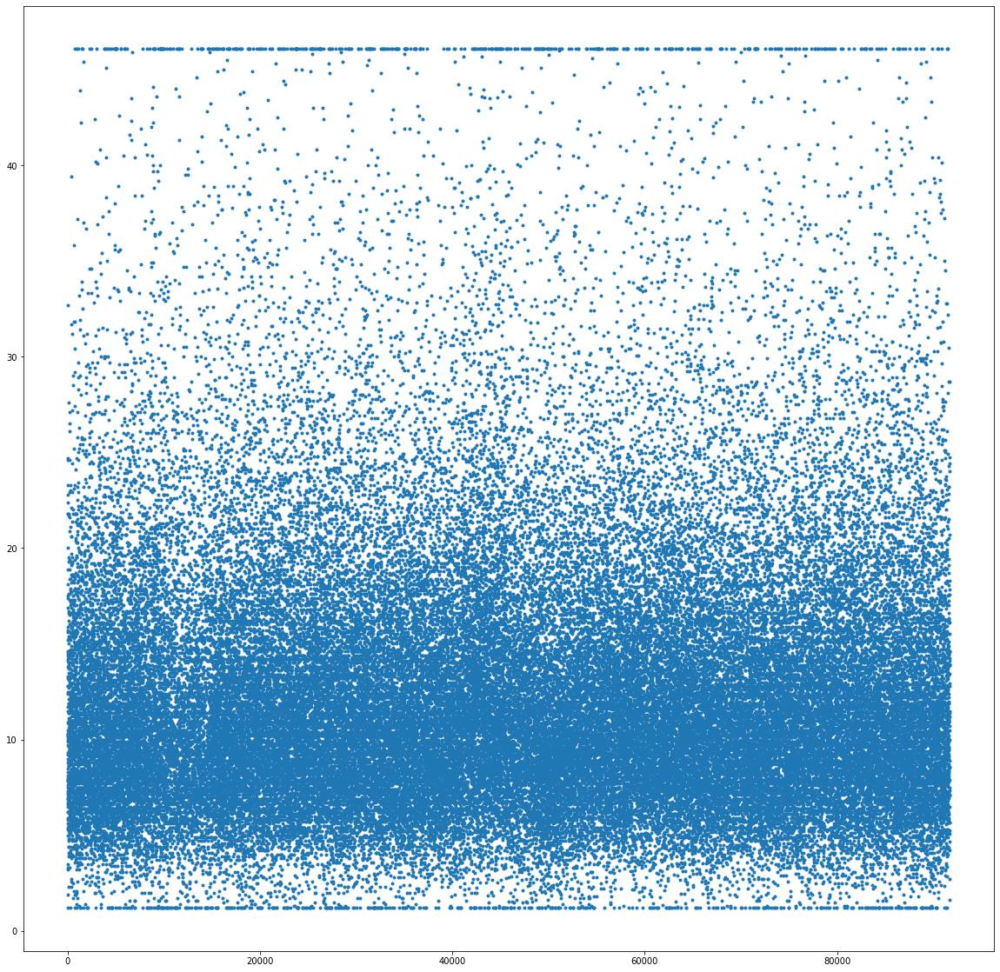

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['d1_wbc_max'],'.')
plt.show()

**d1_wbc_min**


(0.9, 40.898)

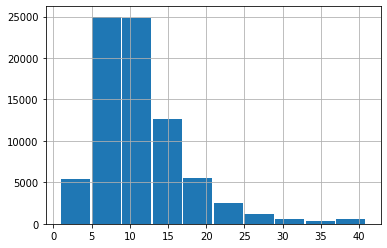

In [0]:
data['d1_wbc_min'].hist(rwidth=0.95)
min(data['d1_wbc_min']),max(data['d1_wbc_min'])

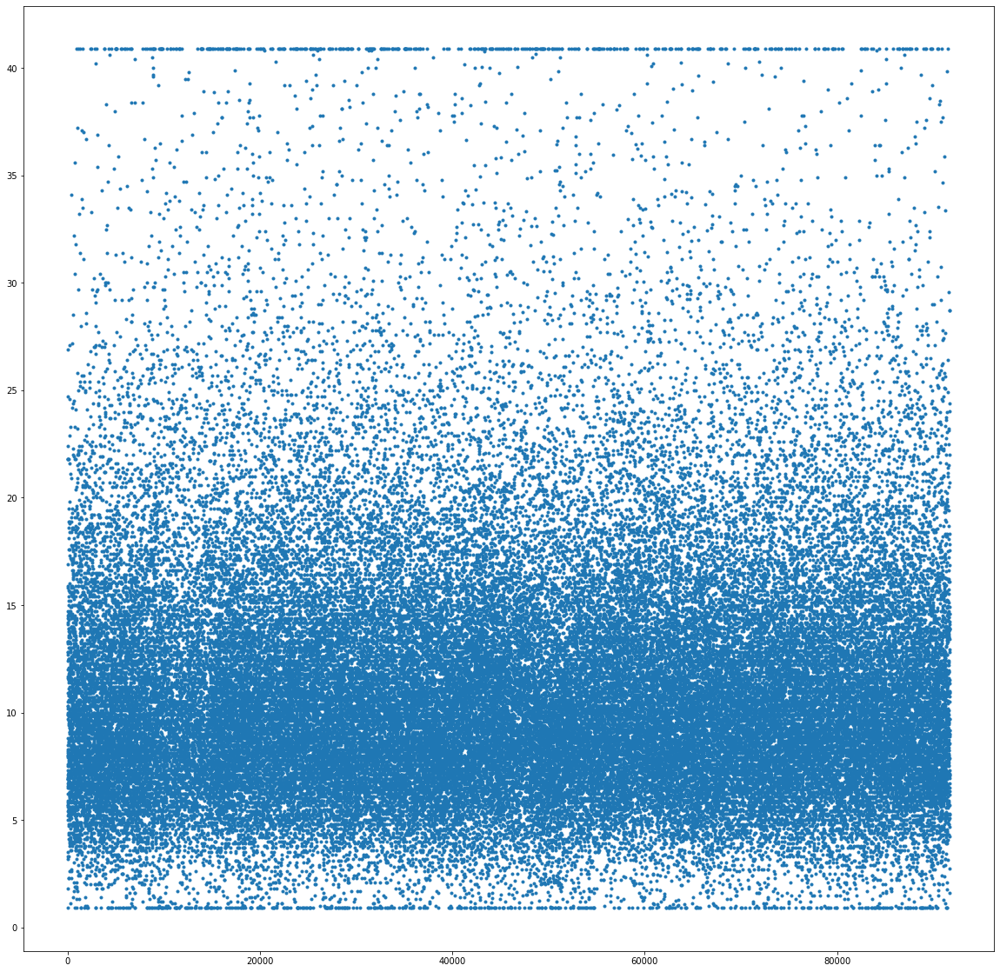

In [0]:

plt.figure(figsize=(20,20))
plt.plot(data['d1_wbc_min'],'.')
plt.show()

**apache_4a_hospital_death_prob**: The APACHE IVa probabilistic prediction of in-hospital mortality for the patient which utilizes the APACHE III score and other covariates, including diagnosis

(-1.0, 0.99)

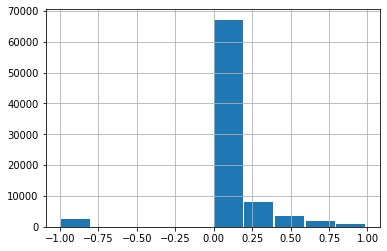

In [0]:
data['apache_4a_hospital_death_prob'].hist(rwidth=0.95)
min(data['apache_4a_hospital_death_prob']),max(data['apache_4a_hospital_death_prob'])

**Importante: quitar errores --> valores negativos**

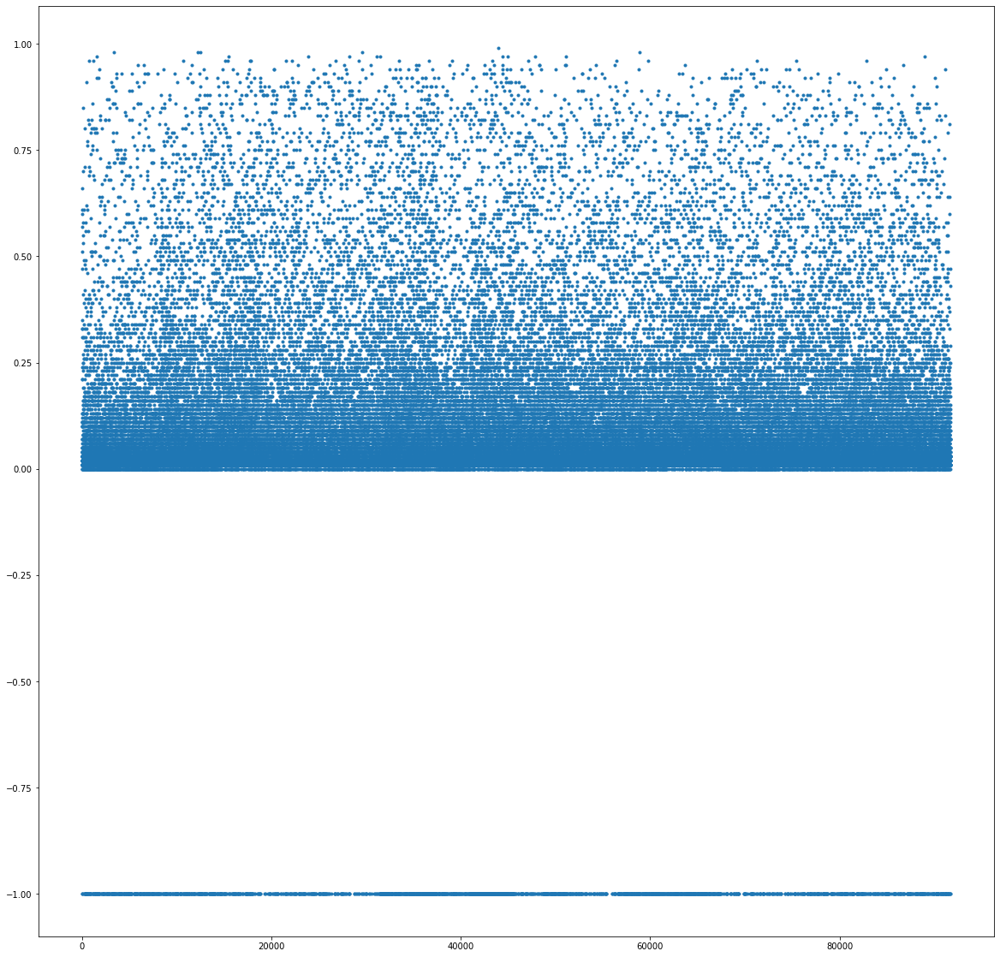

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['apache_4a_hospital_death_prob'],'.')
plt.show()

https://www.kaggle.com/c/widsdatathon2020/discussion/127698
Los valores negativos (imposibles: porque no existen probs negativas) pueden indiar que son missing values.

In [0]:
df_thresh['apache_4a_hospital_death_prob'].isna().sum()

7947

In [0]:
count = 0
for i in df_thresh['apache_4a_hospital_death_prob']:
  if i == -1:
    count += 1
print(count)


2371


In [0]:
df_thresh['apache_4a_hospital_death_prob'] = df_thresh['apache_4a_hospital_death_prob'].replace(-1, np.nan)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(0.0, 0.99)

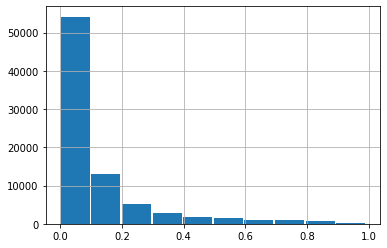

In [0]:
df_thresh['apache_4a_hospital_death_prob'].hist(rwidth=0.95)
min(df_thresh['apache_4a_hospital_death_prob']),max(df_thresh['apache_4a_hospital_death_prob'])

**apache_4a_icu_death_prob**: The APACHE IVa probabilistic prediction of in ICU mortality for the patient which utilizes the APACHE III score and other covariates, including diagnosis

(-1.0, 0.97)

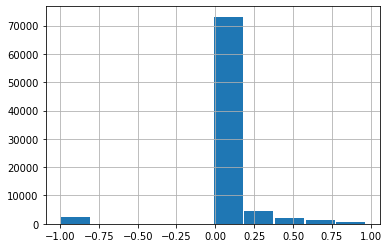

In [0]:
data['apache_4a_icu_death_prob'].hist(rwidth=0.95)
min(data['apache_4a_icu_death_prob']),max(data['apache_4a_icu_death_prob'])


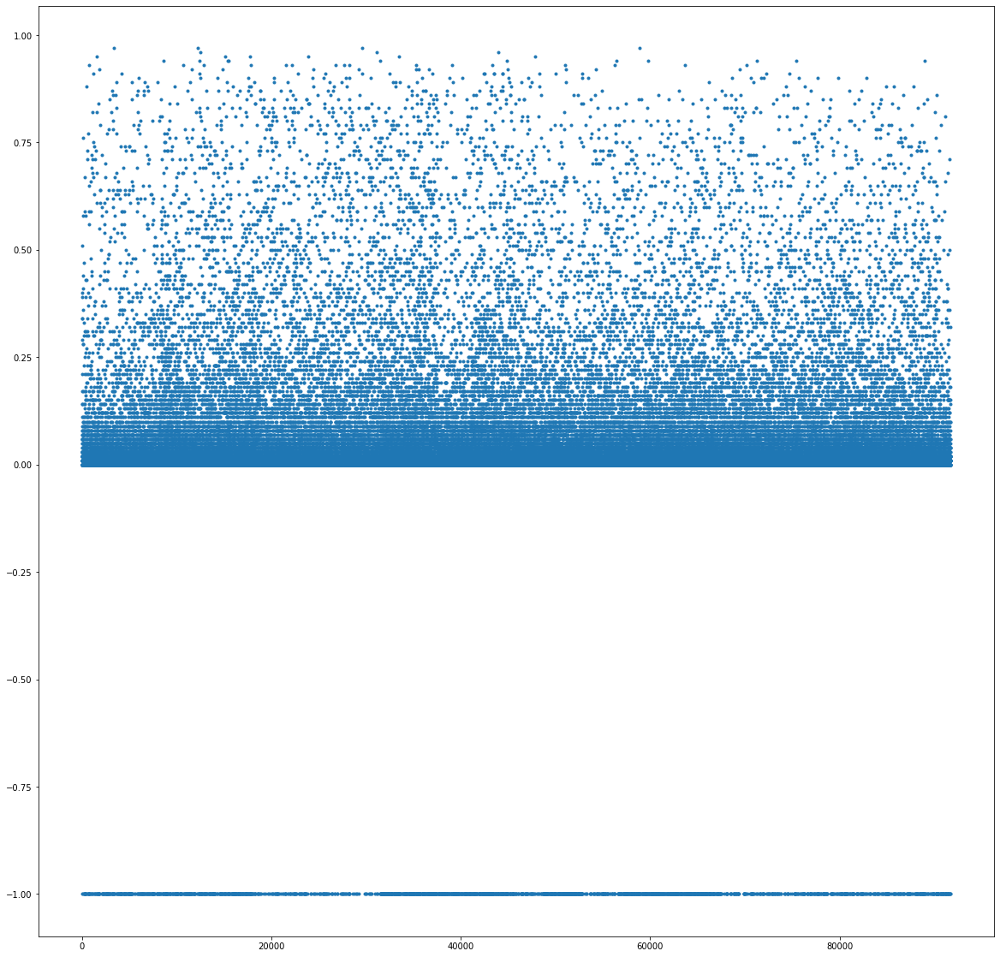

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['apache_4a_icu_death_prob'],'.')
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(0.0, 0.97)

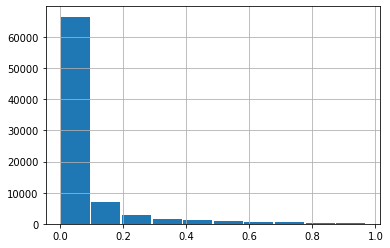

In [0]:
df_thresh['apache_4a_icu_death_prob'] = df_thresh['apache_4a_icu_death_prob'].replace(-1, np.nan)

df_thresh['apache_4a_icu_death_prob'].hist(rwidth=0.95)
min(df_thresh['apache_4a_icu_death_prob']),max(df_thresh['apache_4a_icu_death_prob'])

**aids**

(0.0, 1.0)

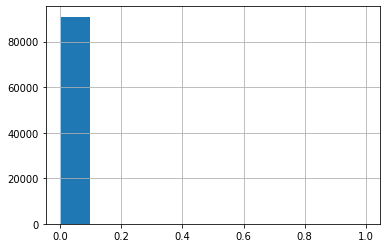

In [0]:
data['aids'].hist(rwidth=0.95)
min(data['aids']),max(data['aids'])

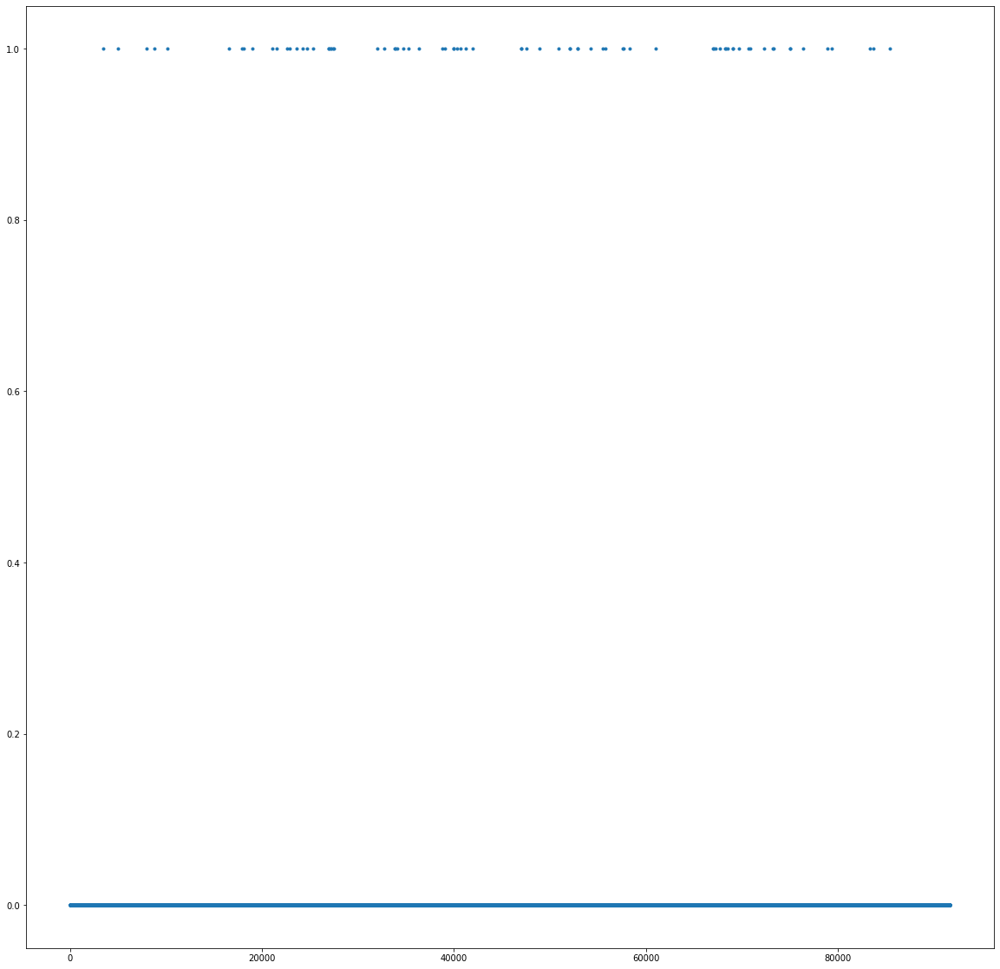

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['aids'],'.')
plt.show()

**cirrhosis**

(0.0, 1.0)

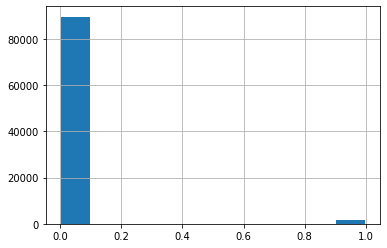

In [0]:
data['cirrhosis'].hist(rwidth=0.95)
min(data['cirrhosis']),max(data['cirrhosis'])

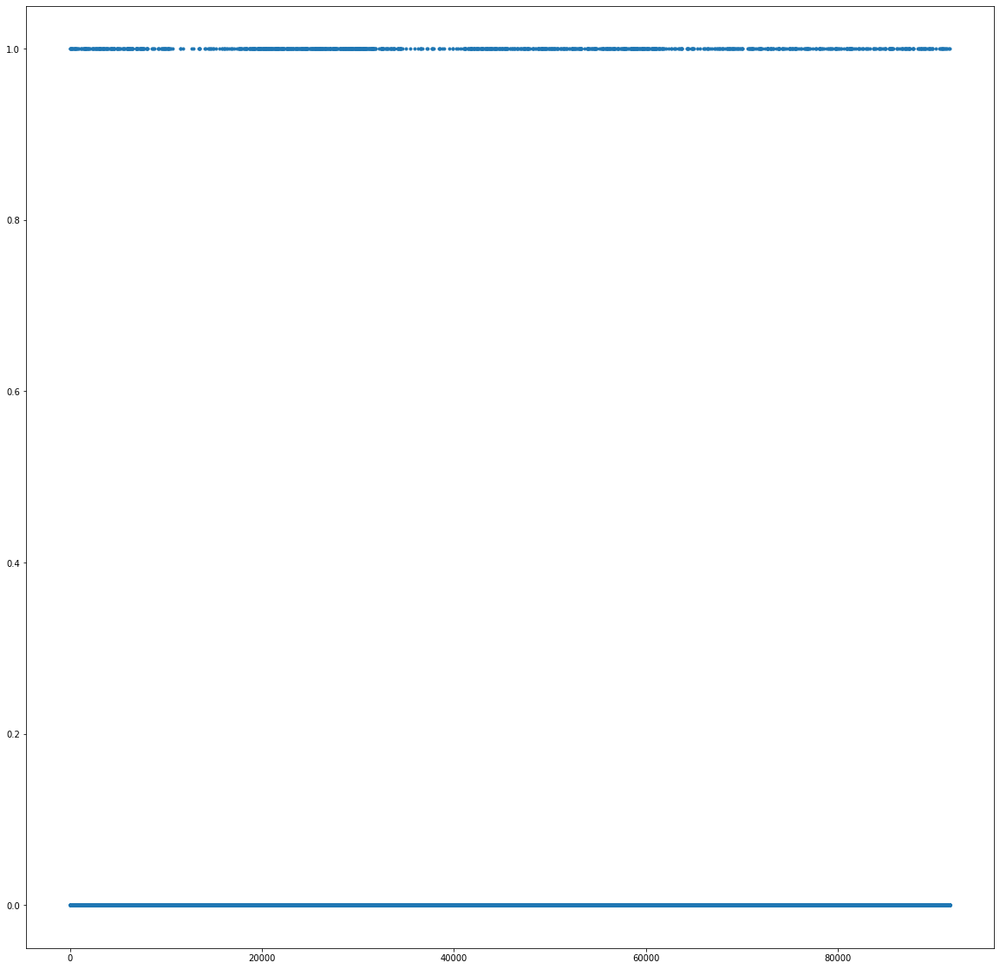

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['cirrhosis'],'.')
plt.show()

**diabetes_mellitus**

(0.0, 1.0)

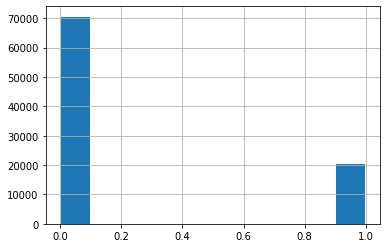

In [0]:
data['diabetes_mellitus'].hist(rwidth=0.95)
min(data['diabetes_mellitus']),max(data['diabetes_mellitus'])

Hay bastantes casos de diabetes

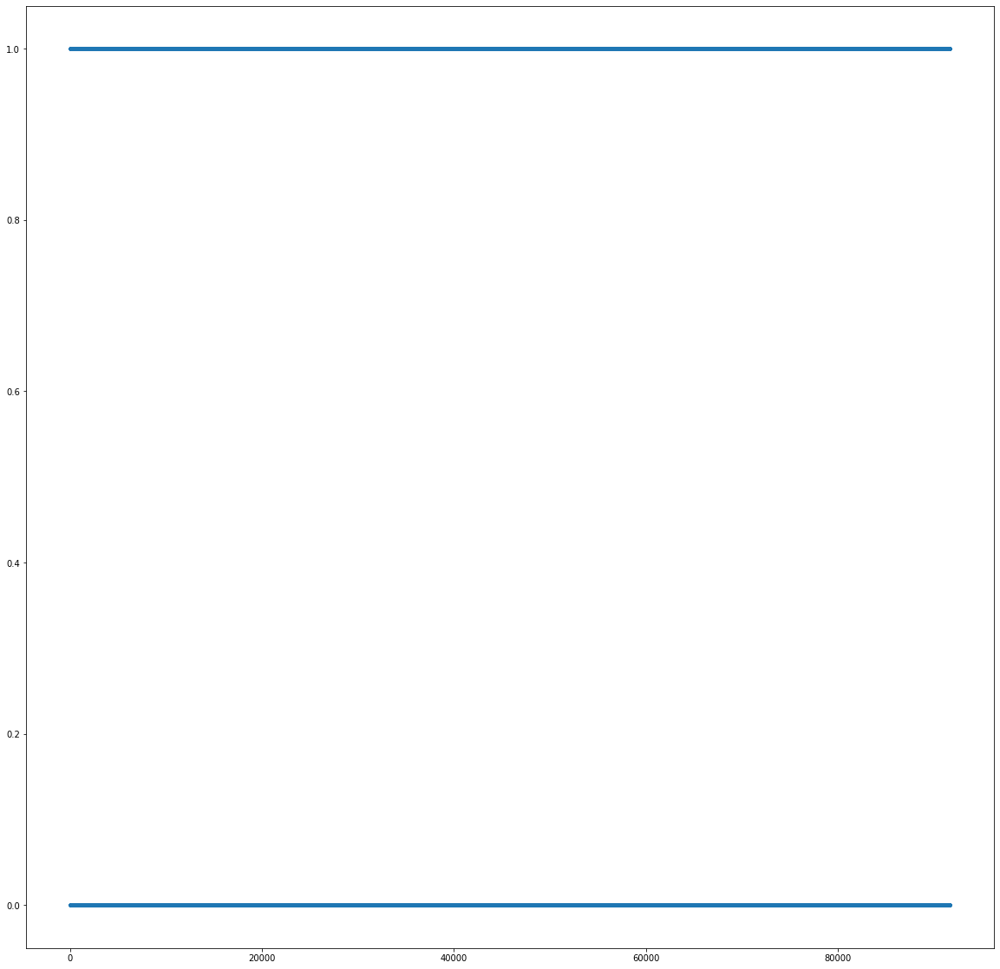

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['diabetes_mellitus'],'.')
plt.show()

**hepatic_failure**

(0.0, 1.0)

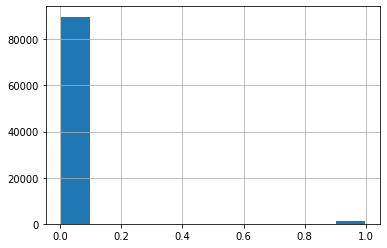

In [0]:
data['hepatic_failure'].hist(rwidth=0.95)
min(data['hepatic_failure']),max(data['hepatic_failure'])

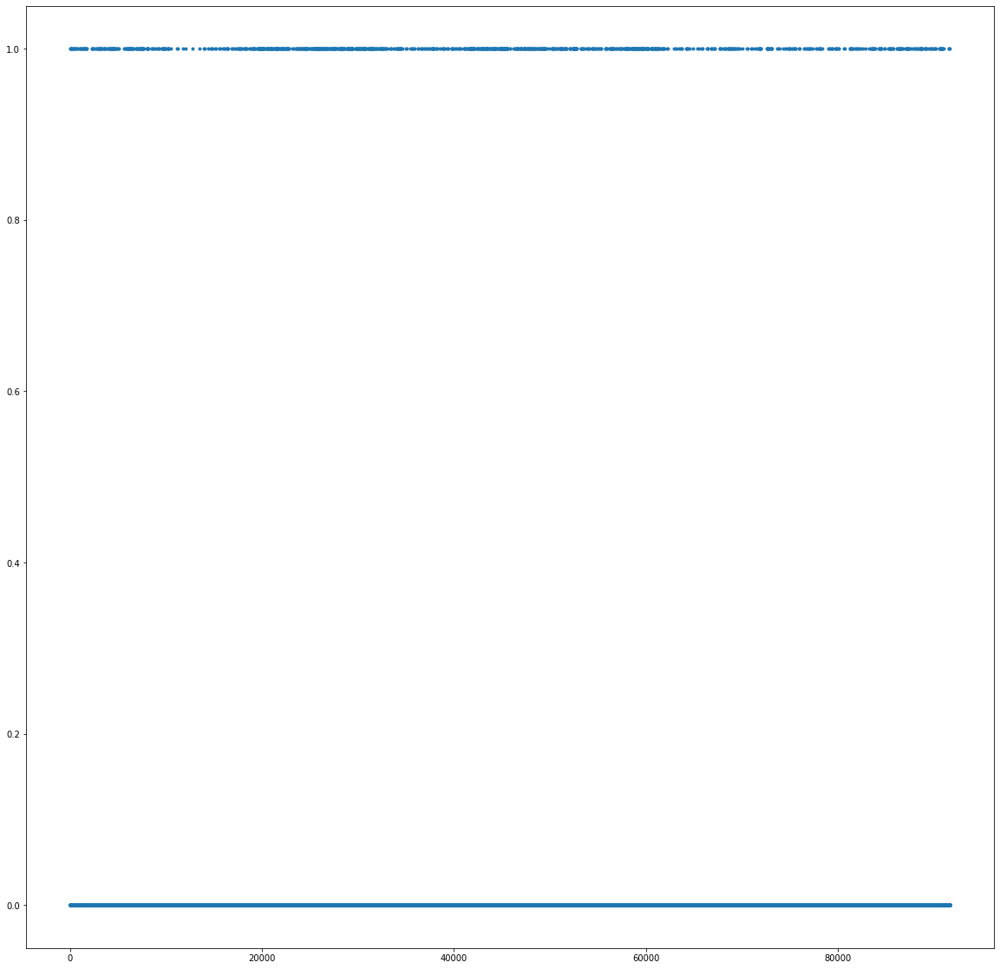

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['hepatic_failure'],'.')
plt.show()

**immunosuppression**

(0.0, 1.0)

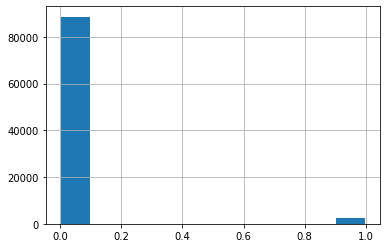

In [0]:
data['immunosuppression'].hist(rwidth=0.95)
min(data['immunosuppression']),max(data['immunosuppression'])

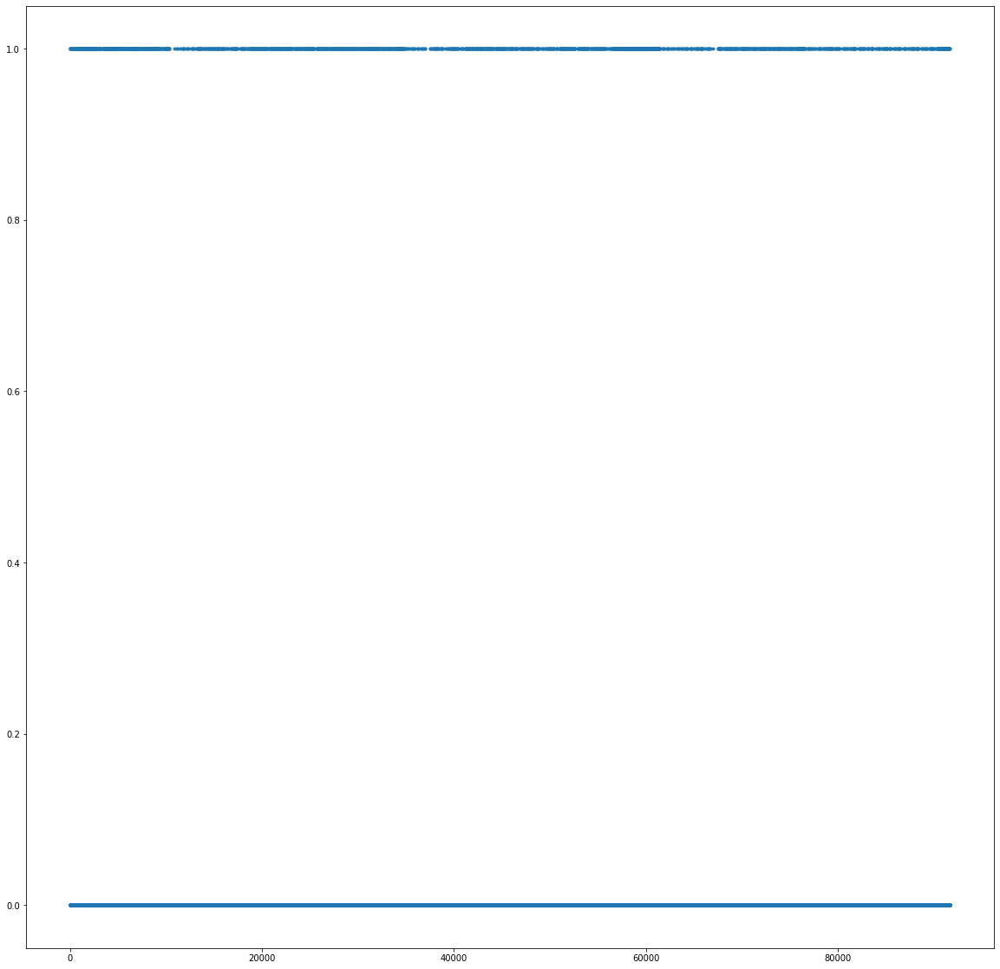

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['immunosuppression'],'.')
plt.show()

**leukemia**

(0.0, 1.0)

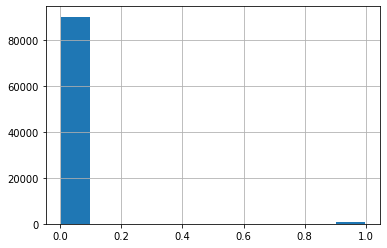

In [0]:
data['leukemia'].hist(rwidth=0.95)
min(data['leukemia']),max(data['leukemia'])

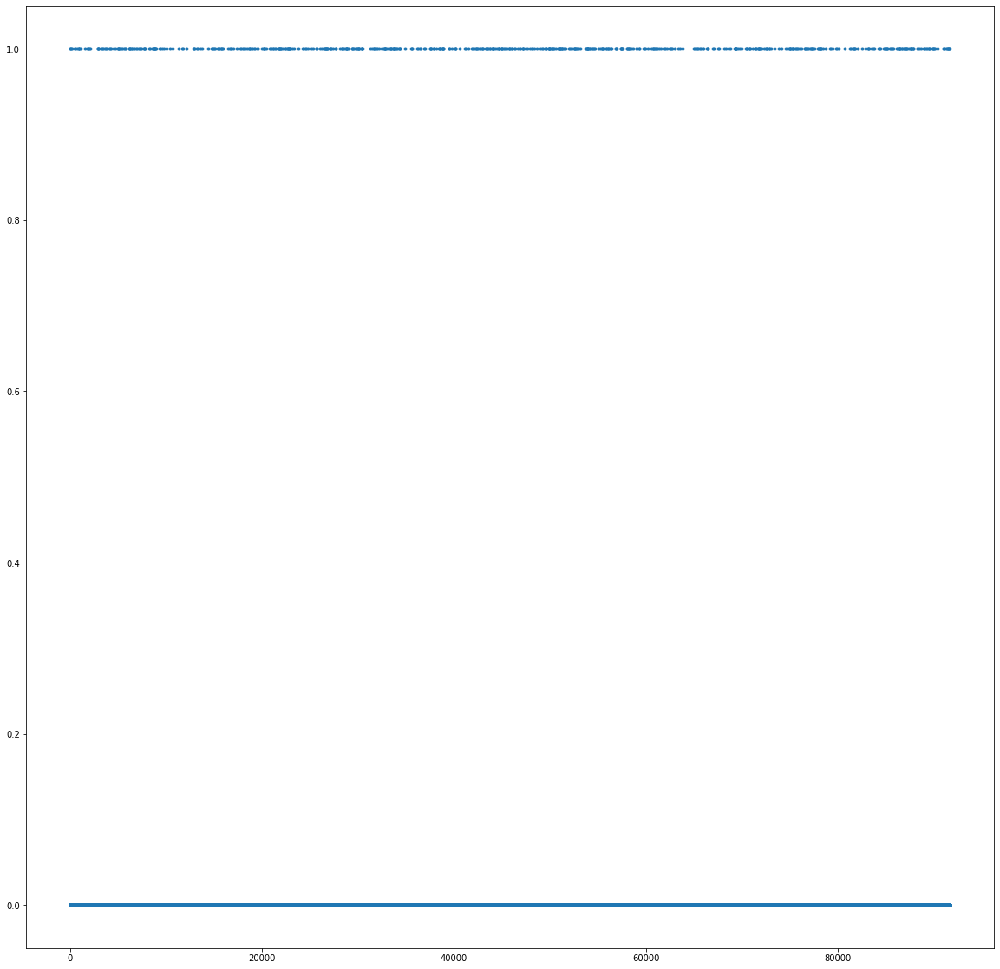

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['leukemia'],'.')
plt.show()

**lymphoma**

(0.0, 1.0)

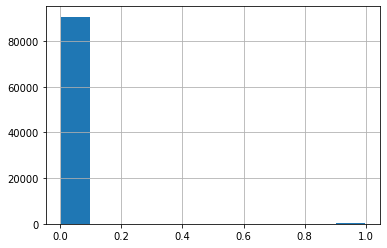

In [0]:
data['lymphoma'].hist(rwidth=0.95)
min(data['lymphoma']),max(data['lymphoma'])

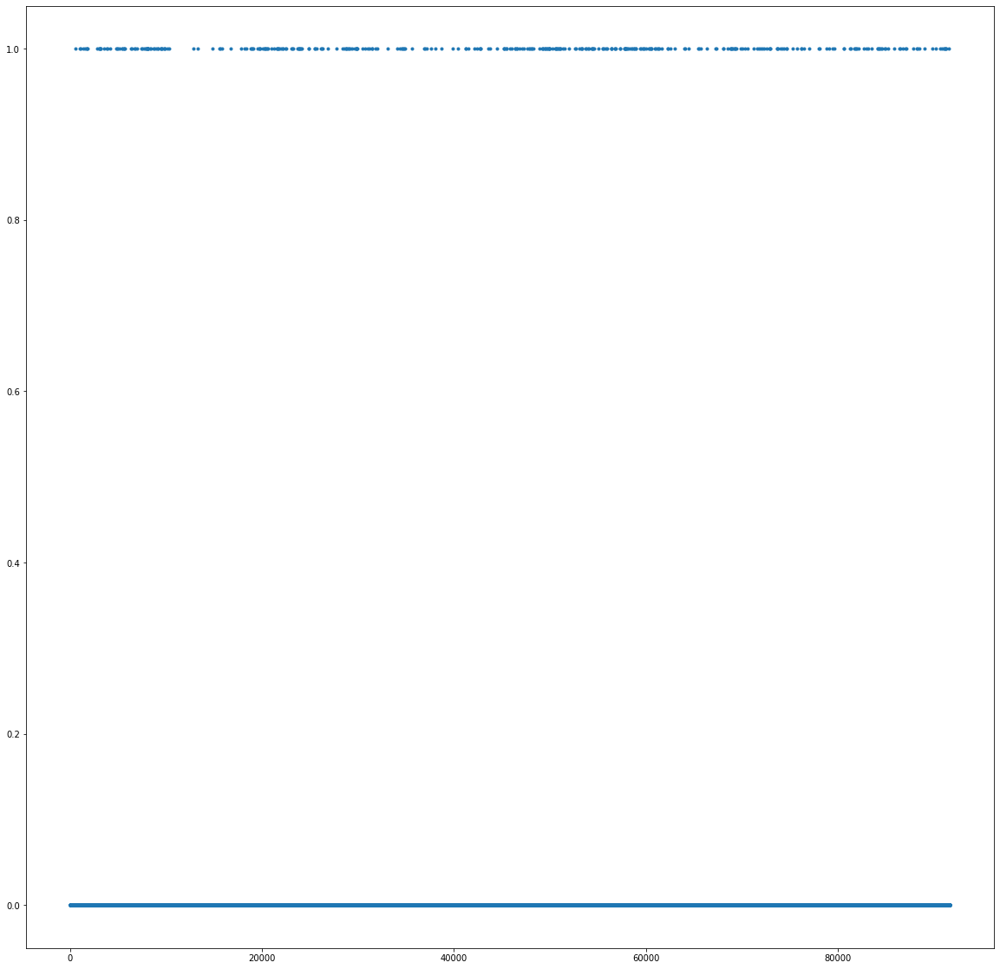

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['lymphoma'],'.')
plt.show()

**solid_tumor_with_metastasis**

(0.0, 1.0)

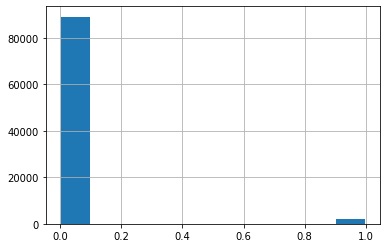

In [0]:
data['solid_tumor_with_metastasis'].hist(rwidth=0.95)
min(data['solid_tumor_with_metastasis']),max(data['solid_tumor_with_metastasis'])

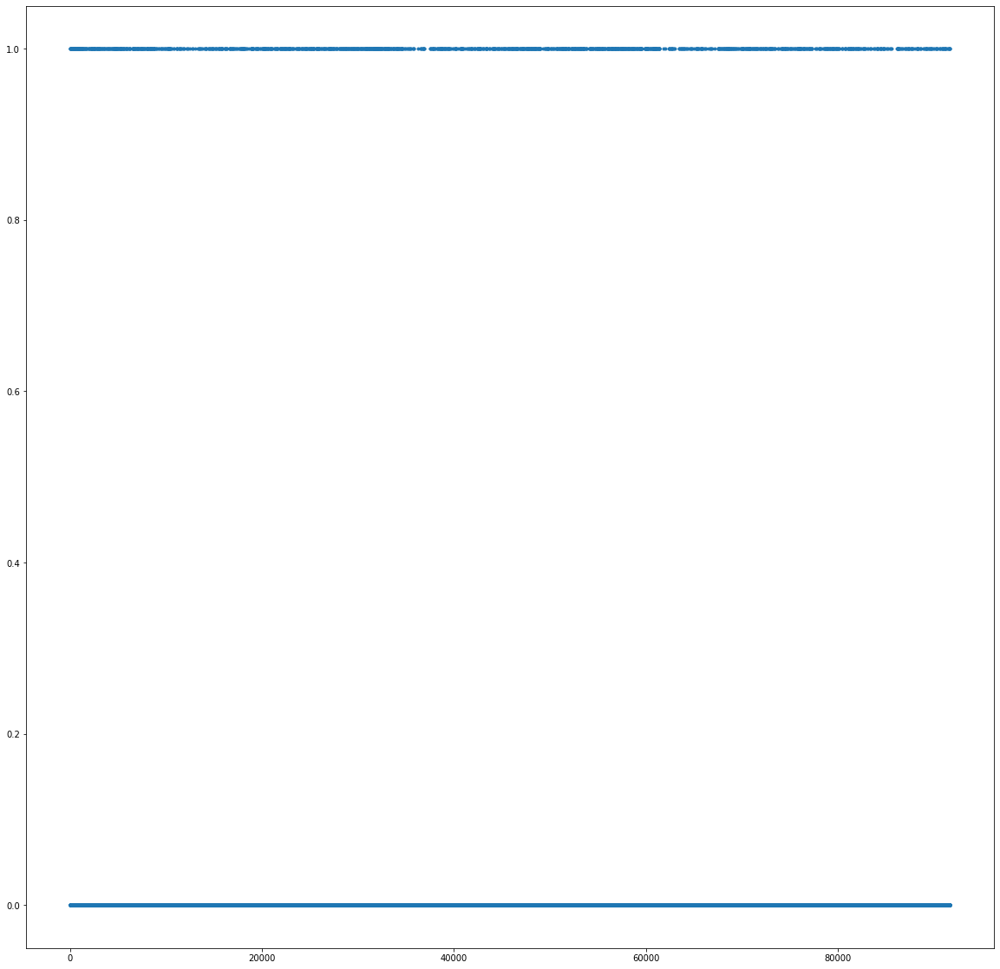

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['solid_tumor_with_metastasis'],'.')
plt.show()

**hospital_death**

(0, 1)

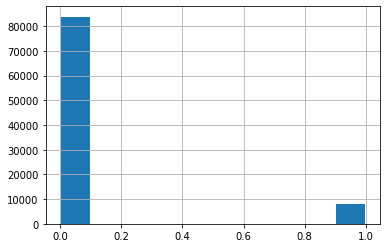

In [0]:
data['hospital_death'].hist(rwidth=0.95)
min(data['hospital_death']),max(data['hospital_death'])

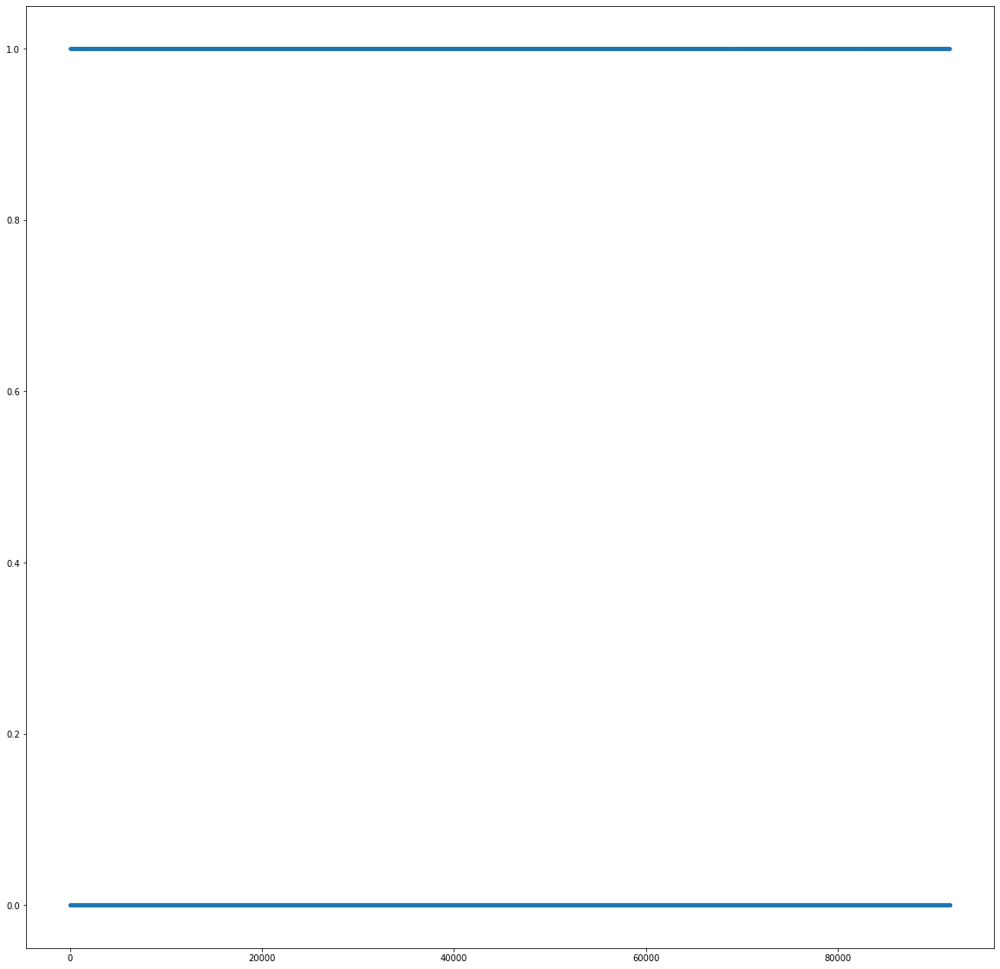

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['hospital_death'],'.')
plt.show()

**elective_surgery**

(0, 1)

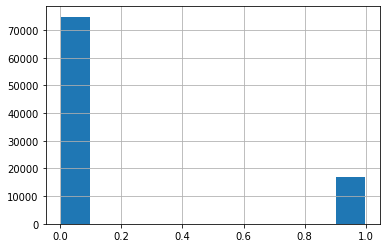

In [0]:
data['elective_surgery'].hist(rwidth=0.95)
min(data['elective_surgery']),max(data['elective_surgery'])

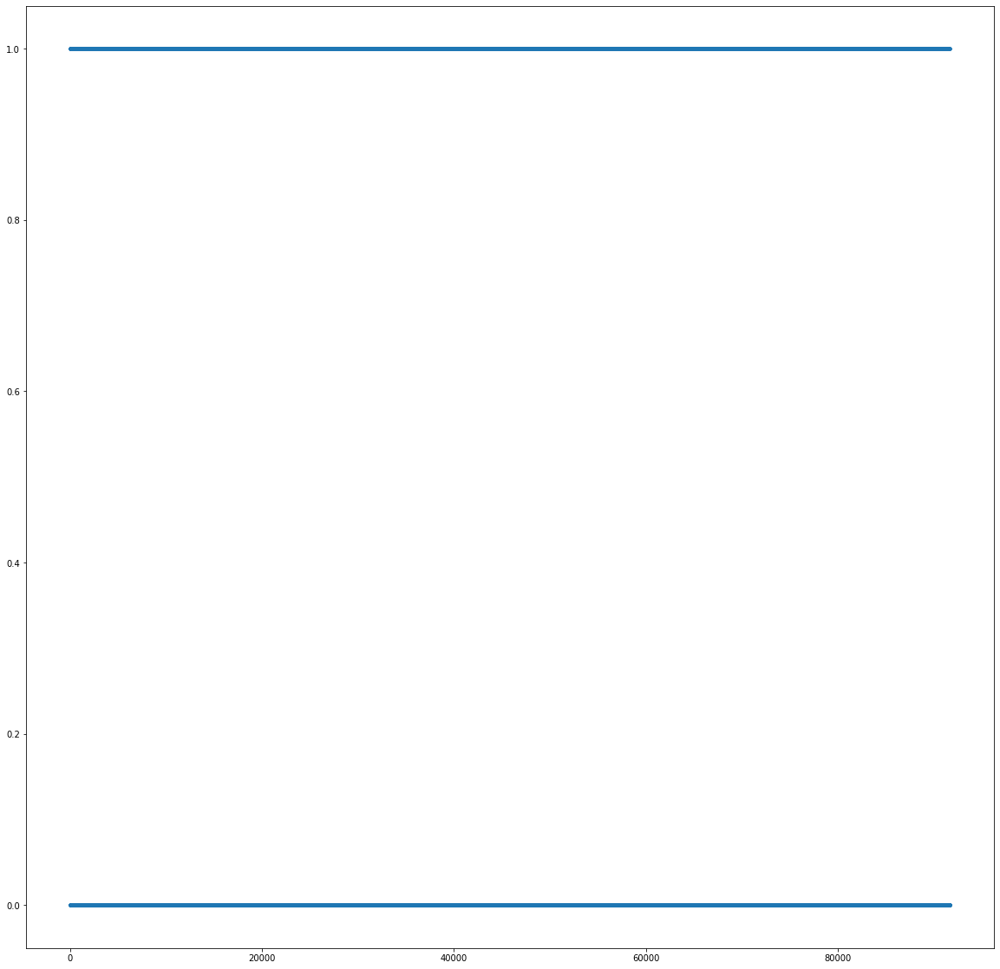

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['elective_surgery'],'.')
plt.show()

**Ethnicity**

([0, 1, 2, 3, 4, 5], <a list of 6 Text major ticklabel objects>)

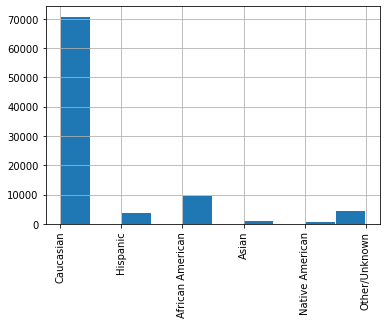

In [0]:
data['ethnicity'].hist(rwidth=0.95)
plt.xticks(rotation='vertical')

**Gender**

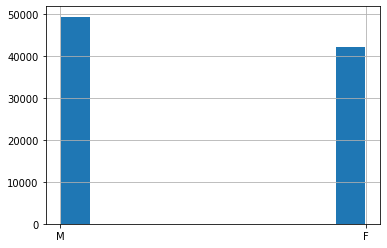

In [0]:
data['gender'].hist(rwidth=0.95)

**hospital_admit_source**: The location of the patient prior to being admitted to the hospital

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
 <a list of 15 Text major ticklabel objects>)

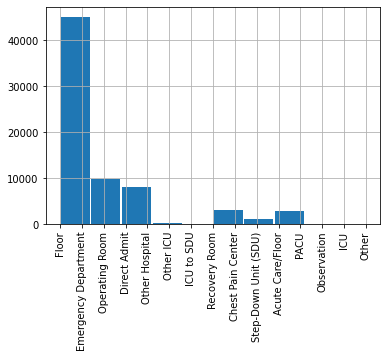

In [0]:
data['hospital_admit_source'].hist(rwidth=0.95)
plt.xticks(rotation='vertical')

**icu_admit_source**: The location of the patient prior to being admitted to the unit

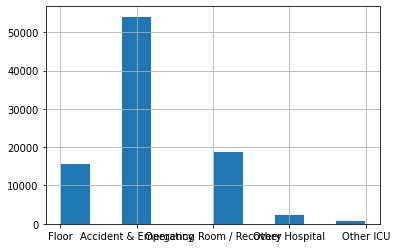

In [0]:
data['icu_admit_source'].hist(rwidth=0.95)

**icu_stay_type**

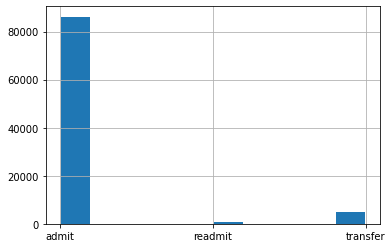

In [0]:
data['icu_stay_type'].hist(rwidth=0.95)

**icu_type**: A classification which indicates the type of care the unit is capable of providing

([0, 1, 2, 3, 4, 5, 6, 7], <a list of 8 Text major ticklabel objects>)

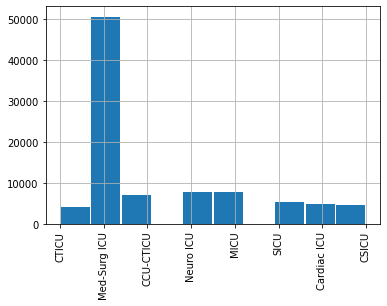

In [0]:
data['icu_type'].hist(rwidth=0.95)
plt.xticks(rotation='vertical')

**apache_post_operative**: The APACHE operative status

(0, 1)

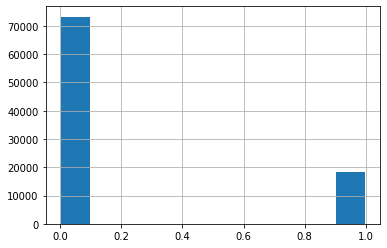

In [0]:
data['apache_post_operative'].hist(rwidth=0.95)
min(data['apache_post_operative']),max(data['apache_post_operative'])

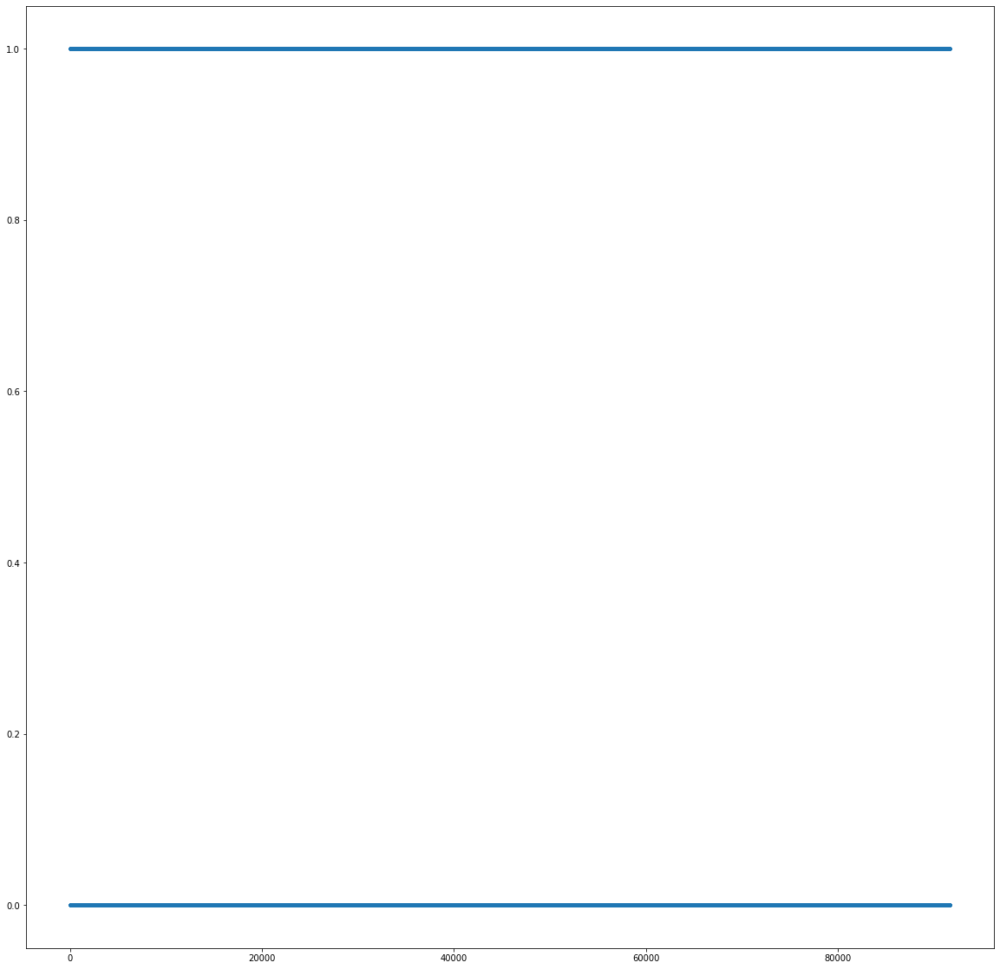

In [0]:
plt.figure(figsize=(20,20))
plt.plot(data['apache_post_operative'],'.')
plt.show()

**apache_3j_bodysystem**: Admission diagnosis group for APACHE III

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 <a list of 11 Text major ticklabel objects>)

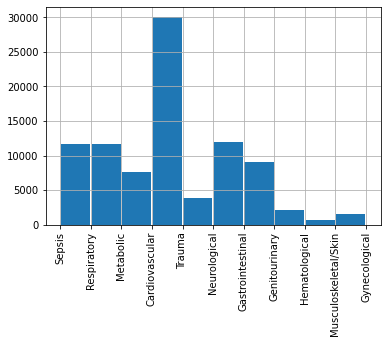

In [0]:
data['apache_3j_bodysystem'].hist(rwidth=0.95)
plt.xticks(rotation='vertical')

**apache_2_bodysystem**: Admission diagnosis group for APACHE II

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], <a list of 10 Text major ticklabel objects>)

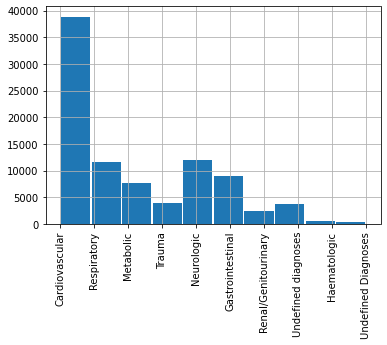

In [0]:
data['apache_2_bodysystem'].hist(rwidth=0.95)
plt.xticks(rotation='vertical')

La mayoría de pacientes de UCI tienen problemas graves cardiovasculares.